# Image XAI Experiment #1

XAI 기술을 활용한 이미지 데이터 분석 기술 테스트

> Perturbation 기반 데이터 드리프트 분석 기술 구현

* 시각화를 위한 사전준비

In [1]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import platform
import warnings

def setup_korean_font():
    """
    시스템에 맞는 한글 폰트를 설정합니다.
    """
    system = platform.system()
    
    if system == "Darwin":  # macOS
        # macOS 기본 한글 폰트들
        korean_fonts = [
            'AppleGothic',
            'NanumGothic',
            'NanumBarunGothic',
            'Malgun Gothic',
            'Arial Unicode MS'
        ]
    elif system == "Windows":
        # Windows 기본 한글 폰트들
        korean_fonts = [
            'Malgun Gothic',
            'NanumGothic',
            'NanumBarunGothic',
            'Batang',
            'Dotum'
        ]
    else:  # Linux
        # Linux 한글 폰트들
        korean_fonts = [
            'NanumGothic',
            'NanumBarunGothic',
            'DejaVu Sans',
            'Liberation Sans'
        ]
    
    # 사용 가능한 폰트 찾기
    available_fonts = [f.name for f in fm.fontManager.ttflist]
    
    for font in korean_fonts:
        if font in available_fonts:
            plt.rcParams['font.family'] = font
            print(f"한글 폰트 '{font}' 적용 완료")
            return True
    
    # 폰트를 찾지 못한 경우 경고
    warnings.warn("적절한 한글 폰트를 찾을 수 없습니다. 기본 폰트를 사용합니다.")
    return False

In [ ]:
# 한글 폰트 설정
setup_korean_font()
# "-" 깨짐 현상 해결을 위해 추가
plt.rcParams['axes.unicode_minus'] = False

한글 폰트 'AppleGothic' 적용 완료


True

## Methodology

슈퍼픽셀을 활용한 이미지 데이터 드리프트 분석 방법론<br><br>
**Model Evaluation Output Comparison**<br>
원본과 슈퍼픽셀 마스킹 이미지에 대한 동일 객체 컨피던스 비교
> 각 이미지 영역(슈퍼픽셀)과 모델 예측 결과 간 상관관계 분석<br>
> 탐지된 특정 객체에 대한 confidence, IoU 기반으로 각 슈퍼픽셀의 추론 기여도 측정<br><br>
> 무작위 데이터 덤프에 대한 이상치 데이터 판별 및 드리프트 발생 원인에 대한 합리적 추론 도출을 기대함

### YOLO model 제어

shap value 계산을 위한 특정 객체 인덱스 추출<br>
검출 정보 가공, 특정 정보 추출, 시각화 기능<br>
특정 객체 인덱스에 대한 추론 정보 추출

In [16]:
def analyze_yolo_results_detailed(model, test_image, conf_threshold=0.25, iou_threshold=0.45):
    """
    parse_detections 방식을 사용하여 YOLO 결과를 상세히 분석합니다.
    """
    print("=== YOLO 결과 상세 분석 (parse_detections 방식) ===")
    
    # YOLO 예측
    try:
        result = model(test_image, conf=conf_threshold, iou=iou_threshold, verbose=False)
        print(f"예측 성공: {type(result)}")
        
        # 결과가 리스트인 경우 첫 번째 요소 사용
        if isinstance(result, list):
            result = result[0]
            print("결과가 리스트 형태입니다. 첫 번째 요소를 사용합니다.")
        
        # parse_detections 방식으로 결과 파싱
        boxes = []
        colors = []
        names = []
        confidences = []
        class_ids = []
        
        if hasattr(result, 'boxes') and result.boxes is not None:
            print(f"탐지된 객체 수: {len(result.boxes)}")
            
            for i, box in enumerate(result.boxes):
                # parse_detections와 동일한 방식
                box_coords = box.xyxy[0].cpu().numpy()  # x1, y1, x2, y2 형식
                conf = float(box.conf)
                cls = int(box.cls)
                name = result.names[cls]
                
                boxes.append(box_coords)
                confidences.append(conf)
                class_ids.append(cls)
                names.append(f"{name} {conf:.2f}")
                
                print(f"  객체 {i+1}: {name} (신뢰도: {conf:.3f})")
                print(f"    박스 좌표: {box_coords}")
        else:
            print("탐지된 객체가 없습니다.")
        
        # 클래스별 통계
        if class_ids:
            unique_classes = set(class_ids)
            print(f"\n탐지된 클래스: {unique_classes}")
            
            for cls_id in unique_classes:
                cls_confidences = [conf for cls, conf in zip(class_ids, confidences) if cls == cls_id]
                cls_name = result.names[cls_id]
                print(f"  {cls_name}: {len(cls_confidences)}개 (평균 신뢰도: {np.mean(cls_confidences):.3f})")
        
        return result, boxes, confidences, class_ids, names
        
    except Exception as e:
        print(f"예측 실패: {e}")
        import traceback
        traceback.print_exc()
        return None, [], [], [], []

In [17]:
def parse_detections(results, mono=False, cls_name=None):
    """YOLO 모델의 결과를 박스, 색상, 클래스명으로 파싱"""
    boxes = []
    colors = []
    names = []
    indices = []

    if mono:
        result = results[0]
        box = result.xyxy[0].cpu().numpy()  # x1, y1, x2, y2 형식
        conf = float(result.conf)
        cls = int(result.cls)
        name = cls_name

        boxes.append(box)
        colors.append(generate_color(cls))  # 클래스별 고유 색상
        names.append(f"{name} {conf:.2f}")

        return boxes, colors, names

    else:
        for i, result in enumerate(results[0].boxes):
            box = result.xyxy[0].cpu().numpy()  # x1, y1, x2, y2 형식
            conf = float(result.conf)
            cls = int(result.cls)
            name = results[0].names[cls]
            
            boxes.append(box)
            colors.append(generate_color(cls))  # 클래스별 고유 색상
            names.append(f"{name} {conf:.2f}")
            indices.append(i)

    return np.array(boxes), colors, names, indices

def generate_color(class_id):
    """클래스 ID에 따른 고유한 색상 생성"""
    np.random.seed(class_id)
    color = np.random.randint(0, 255, size=3).tolist()
    return color

def draw_detections(boxes, colors, names, image, indices=None):
    """검출 결과를 이미지에 시각화"""
    for i, (box, color, name) in enumerate(zip(boxes, colors, names)):
        x1, y1, x2, y2 = map(int, box)
        
        # 박스 그리기
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        
        # 클래스명과 신뢰도 텍스트 (박스 위에 표시)
        class_text = name
        (text_w, text_h), _ = cv2.getTextSize(class_text, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)
        cv2.rectangle(image, (x1, y1-text_h-4), (x1+text_w, y1), color, -1)
        cv2.putText(image, class_text, (x1, y1-4), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 1)

        # 인덱스 텍스트 (박스 좌하단에 표시)
        if indices is not None:
            # indices가 제공된 경우 해당 인덱스 사용
            idx = indices[i] if i < len(indices) else i
        else:
            # indices가 None인 경우 단일 객체로 간주하여 인덱스 0 사용
            idx = 0
            
        index_text = f"#{idx}"
        (index_w, index_h), _ = cv2.getTextSize(index_text, cv2.FONT_HERSHEY_SIMPLEX, 0.4, 1)
        cv2.rectangle(image, (x1, y2), (x1+index_w, y2+index_h+2), color, -1)
        cv2.putText(image, index_text, (x1, y2+index_h), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255,255,255), 1)
    
    return image

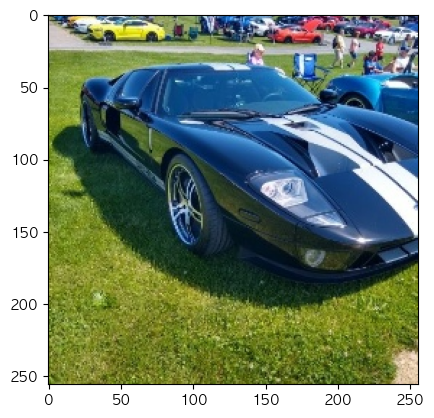

(256, 256, 3)


In [18]:
from PIL import Image
from matplotlib import pyplot as plt
import os
from ultralytics import YOLO

model_path = "yolov8n.pt"
model = YOLO(model_path)

test_data_path = "../datadoctor_cli_test/datasets/test_data2"
test_data_list = ['car680.jpg', 'car697.jpg', 'car698.jpg', 'car702.jpg', 'car707.jpg']
test_img = Image.open(os.path.join(test_data_path, test_data_list[1]))

plt.imshow(test_img)
plt.show()

print(np.array(test_img).shape)


0: 640x640 5 persons, 7 cars, 80.2ms
Speed: 5.0ms preprocess, 80.2ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)


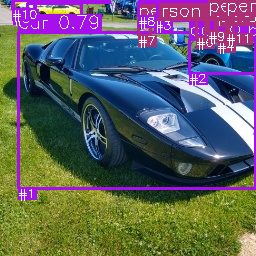

In [19]:
from ultralytics import YOLO
import cv2

bbox_img = np.array(test_img)
model = YOLO(model_path)

results = model(bbox_img)
boxes, colors, names, indices = parse_detections(results)

detections = draw_detections(boxes, colors, names, bbox_img.copy(), indices)
display(Image.fromarray(detections))

In [20]:
import numpy as np

def yolo_predict_targeted(images, model, target_index=None):
    """
    YOLO 예측 함수 - 특정 인덱스의 객체 또는 모든 탐지된 객체 반환.
    `images`는 YOLO 모델이 처리할 수 있는 형식 (PIL Image, NumPy array 등).
    """
    if model is None:
        print("Error: YOLO model is not loaded. Cannot perform prediction.")
        return []

    results = model(images)

    if not results or not results[0].boxes or len(results[0].boxes) == 0:
        return []

    detected_boxes = results[0].boxes
    class_names = results[0].names

    if target_index is not None:
        if 0 <= target_index < len(detected_boxes):
            selected_box = detected_boxes[target_index]
            selected_class_name = class_names[int(selected_box.cls)]
            return [selected_box], [selected_class_name]
        else:
            print(f"Warning: target_index ({target_index}) is out of bounds. "
                  f"Only {len(detected_boxes)} objects detected.")
            return [], []
    else:
        return results # Returns a list of Results objects (usually one for single image)

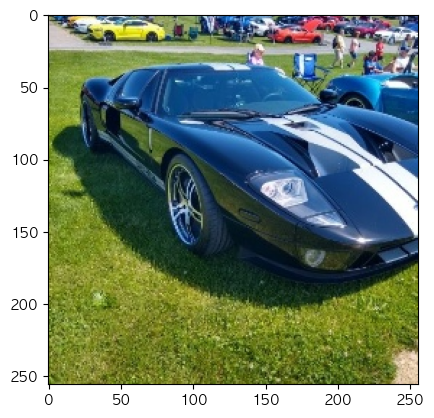

In [21]:
from ultralytics import YOLO
import cv2

model_path = "yolov8n.pt"
model = YOLO(model_path)

test_data_path = "../datadoctor_cli_test/datasets/test_data2"
test_data_list = ['car680.jpg', 'car697.jpg', 'car698.jpg', 'car702.jpg', 'car707.jpg']
test_img = cv2.imread(os.path.join(test_data_path, test_data_list[1]))
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

plt.imshow(test_img)
plt.show()

In [22]:
# 인덱스 1번 객체만 검출
idx_1_result, cls_name = yolo_predict_targeted(test_img, model, target_index=1)

for class_id, name in model.names.items():
    if name == cls_name[0]:
        target_class_id = class_id

print(type(idx_1_result))
print(idx_1_result)
print(cls_name[0])
print(target_class_id)


0: 640x640 5 persons, 7 cars, 56.0ms
Speed: 1.8ms preprocess, 56.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
<class 'list'>
[ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.])
conf: tensor([0.7914])
data: tensor([[ 18.2480,  32.6840, 255.5966, 188.9793,   0.7914,   2.0000]])
id: None
is_track: False
orig_shape: (256, 256)
shape: torch.Size([1, 6])
xywh: tensor([[136.9223, 110.8317, 237.3486, 156.2953]])
xywhn: tensor([[0.5349, 0.4329, 0.9271, 0.6105]])
xyxy: tensor([[ 18.2480,  32.6840, 255.5966, 188.9793]])
xyxyn: tensor([[0.0713, 0.1277, 0.9984, 0.7382]])]
car
2


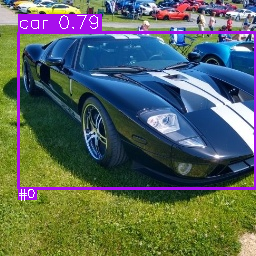

In [23]:
boxes, colors, names = parse_detections(idx_1_result, mono=True, cls_name=cls_name[0])
detections = draw_detections(boxes, colors, names, bbox_img.copy())

display(Image.fromarray(detections))

### Pipeline Test

> 원본 이미지 추론 수행
>* bbox, cls_name, conf 정보 저장

> 슈퍼픽셀 계산 및 생성
>* 특정 슈퍼픽셀 마스킹 이미지 생성

> 마스킹 이미지 추론 수행
>* iou 계산
>* 임계값 충족 대상 필터링

> 추론 결과 비교 분석
>* 원본 이미지 vs 마스킹 이미지
>* target object에 결과 비교
>* confidence, IoU 수치 등 분석 결과에 포함

In [24]:
import cv2
import numpy as np
import torch
from torchvision import transforms
from PIL import Image
from skimage.segmentation import slic, mark_boundaries
from skimage.util import img_as_float
import shap
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
from ultralytics import YOLO # YOLO 모델 import

* 원본 이미지 예측 수행, 타겟 객체 추출

In [25]:
# 전역 변수 (모델 로드 등) - 실제 사용 시에는 이 부분이 main 함수나 클래스 내부에 있을 수 있습니다.
yolo_model = model # 여기에 YOLO 모델 객체를 할당할 예정
example_image_path = os.path.join(test_data_path, test_data_list[1]) # 예시 이미지 경로 (적절히 수정 필요)

# 예시 이미지 로드
original_img_bgr = cv2.imread(example_image_path)
if original_img_bgr is None:
    print(f"오류: '{example_image_path}' 이미지를 로드할 수 없습니다. 경로를 확인해주세요.")
    exit()
original_img_rgb = cv2.cvtColor(original_img_bgr, cv2.COLOR_BGR2RGB)
print(f"원본 이미지 로드 완료. 크기: {original_img_rgb.shape}")

# 2. YOLO 모델로 초기 탐지 수행 및 대상 객체 인덱스 확인
print("\n--- 2. YOLO 초기 탐지 및 대상 객체 인덱스 선택 ---")

initial_full_results = yolo_model(original_img_rgb, verbose=False)

if not initial_full_results or not initial_full_results[0].boxes:
    print("이미지에서 객체가 탐지되지 않았습니다. 종료합니다.")
    exit()

first_image_results = initial_full_results[0]

print(f"탐지된 객체 수: {len(first_image_results.boxes)}")

final_target_bbox_xyxy = None
final_target_class_id = None
final_target_class_name = None
target_object_display_index = -1
max_area = 0

for i, box_info in enumerate(first_image_results.boxes):
    # 텐서에서 스칼라로 안전하게 변환
    current_class_id = int(box_info.cls.item()) 
    current_class_name = yolo_model.names[current_class_id] 
    current_confidence = box_info.conf.item() 
    current_xyxy = box_info.xyxy[0].cpu().numpy().tolist()

    # 바운딩 박스 면적 계산
    x1, y1, x2, y2 = current_xyxy
    current_area = (x2 - x1) * (y2 - y1)

    print(f"  [{i}] 클래스='{current_class_name}', 신뢰도={current_confidence:.2f}, 박스={current_xyxy}")
    
    # 탐색 대상 클래스 중에서 가장 큰 바운딩 박스를 가진 객체 선택
    if current_class_name == 'car' and current_area > max_area:
        max_area = current_area
        final_target_bbox_xyxy = current_xyxy
        final_target_class_id = current_class_id
        final_target_class_name = current_class_name
        final_target_conf = current_confidence
        target_object_display_index = i

if final_target_class_id is None:
    print("이미지에서 'car' 객체를 찾을 수 없습니다. 첫 번째 탐지된 객체를 대상으로 합니다.")
    first_box_info = first_image_results.boxes[0]
    final_target_bbox_xyxy = first_box_info.xyxy[0].cpu().numpy().tolist()
    final_target_class_id = int(first_box_info.cls.item())
    final_target_class_name = yolo_model.names[final_target_class_id]
    final_target_conf = first_box_info.conf.item()
    target_object_display_index = 0 

print(f"\nSHAP 계산 대상 객체: 클래스='{final_target_class_name}' (신뢰도: {final_target_conf:.2f}) (ID: {final_target_class_id}), "
        f"원래 바운딩 박스: {final_target_bbox_xyxy}")


# 4. Superpixel 생성
print("\n--- 4. Superpixel 생성 ---")
segments, segmented_img_for_display = create_superpixels(
    original_img_rgb, 
    n_segments=30, 
    compactness=30, 
    algorithm='slic' 
)
print(f"DEBUG: 생성된 슈퍼픽셀 수: {len(np.unique(segments))}")

원본 이미지 로드 완료. 크기: (256, 256, 3)

--- 2. YOLO 초기 탐지 및 대상 객체 인덱스 선택 ---
탐지된 객체 수: 12
  [0] 클래스='car', 신뢰도=0.81, 박스=[27.608814239501953, 3.0651016235351562, 81.3729476928711, 19.362953186035156]
  [1] 클래스='car', 신뢰도=0.79, 박스=[18.248022079467773, 32.683998107910156, 255.5966339111328, 188.97933959960938]
  [2] 클래스='car', 신뢰도=0.68, 박스=[189.0863800048828, 39.62429428100586, 255.93148803710938, 73.874267578125]
  [3] 클래스='car', 신뢰도=0.48, 박스=[154.4243621826172, 7.770901679992676, 188.1894073486328, 20.57655906677246]
  [4] 클래스='person', 신뢰도=0.43, 박스=[217.59854125976562, 25.097156524658203, 228.15390014648438, 41.72736358642578]
  [5] 클래스='car', 신뢰도=0.42, 박스=[13.453173637390137, 0.16590118408203125, 35.34764862060547, 13.114956855773926]
  [6] 클래스='person', 신뢰도=0.40, 박스=[196.3317413330078, 11.650369644165039, 205.7138214111328, 37.7838134765625]
  [7] 클래스='person', 신뢰도=0.39, 박스=[138.20034790039062, 20.70371437072754, 150.66567993164062, 35.85210418701172]
  [8] 클래스='car', 신뢰도=0.35, 박스=[138.9282


--- 통합 시각화 ---


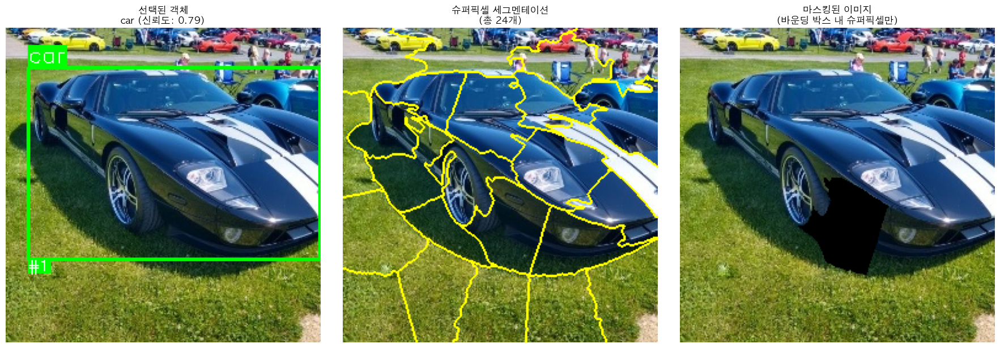


=== 시각화 요약 ===
선택된 객체: car (신뢰도: 0.79)
바운딩 박스: [18.248022079467773, 32.683998107910156, 255.5966339111328, 188.97933959960938]
전체 슈퍼픽셀 수: 24
마스킹된 슈퍼픽셀 수: 255


In [26]:
print("\n--- 통합 시각화 ---")

# 원본 이미지 복사
visualization_img = original_img_rgb.copy()

# 세그먼트 마스킹 이미지
unique_segments = np.unique(segments)
test_segments = np.random.choice(unique_segments, size=min(1, len(unique_segments)), replace=False)
masked_img = mask_superpixels(original_img_rgb, segments, test_segments, mask_value=0)

# 선택된 객체만을 위한 데이터 준비
selected_box = [final_target_bbox_xyxy]
selected_color = [(0, 255, 0)]  # 녹색으로 표시
selected_name = [final_target_class_name]
selected_conf = [final_target_conf]
selected_index = [target_object_display_index]

# draw_detections 함수 사용하여 시각화
visualization_img = draw_detections(
    boxes=selected_box,
    colors=selected_color,
    names=selected_name,
    image=visualization_img,
    indices=selected_index,
)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 1. 선택된 바운딩 박스가 표시된 원본 이미지
axes[0].imshow(visualization_img)
axes[0].set_title(f'선택된 객체\n{final_target_class_name} (신뢰도: {final_target_conf:.2f})', 
                  fontsize=12, fontweight='bold')
axes[0].axis('off')

# 2. 슈퍼픽셀 세그멘테이션 결과
axes[1].imshow(segmented_img_for_display)
axes[1].set_title(f'슈퍼픽셀 세그멘테이션\n(총 {len(np.unique(segments))}개)', 
                  fontsize=12, fontweight='bold')
axes[1].axis('off')

# 3. 마스킹된 이미지
axes[2].imshow(masked_img)
axes[2].set_title(f'마스킹된 이미지\n(바운딩 박스 내 슈퍼픽셀만)', 
                  fontsize=12, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# 추가 정보 출력
print(f"\n=== 시각화 요약 ===")
print(f"선택된 객체: {final_target_class_name} (신뢰도: {final_target_conf:.2f})")
print(f"바운딩 박스: {final_target_bbox_xyxy}")
print(f"전체 슈퍼픽셀 수: {len(np.unique(segments))}")
print(f"마스킹된 슈퍼픽셀 수: {len(np.unique(masked_img[masked_img > 0]))}")

* 마스킹 이미지 예측 수행, IoU 기반으로 타겟 객체 특정

In [27]:
def calculate_iou(boxA, boxB):
    """
    두 개의 바운딩 박스 간의 IoU를 계산합니다.
    Args:
        boxA (list or np.array): [x1, y1, x2, y2]
        boxB (list or np.array): [x1, y1, x2, y2]
    Returns:
        float: IoU 값
    """
    # 각 박스의 좌표 추출
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # 교차 영역의 폭과 높이 계산
    inter_width = max(0, xB - xA)
    inter_height = max(0, yB - yA)

    # 교차 영역의 면적 계산
    inter_area = inter_width * inter_height

    # 각 박스의 면적 계산
    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # 합집합 면적 계산
    union_area = float(boxA_area + boxB_area - inter_area)

    # IoU 계산 (분모가 0인 경우를 방지)
    iou = inter_area / union_area if union_area > 0 else 0.0
    return iou

In [28]:
results = model(masked_img)
# 마스킹된 이미지로 추론
masked_results = model(masked_img)
# 마스킹된 이미지 탐지 결과 파싱
masked_boxes, masked_colors, masked_names, masked_indices = parse_detections(masked_results)
print(f"마스킹된 이미지 탐지 결과: {len(masked_boxes)}개")

마스킹된 이미지 탐지 결과: 12개


In [29]:
# IoU 임계값 설정 (0.9 이상)
iou_threshold = 0.9
filtered_results = []
filtered_indices = []

for i, masked_box in enumerate(masked_boxes):
    iou = calculate_iou(masked_box, final_target_bbox_xyxy)
    
    print(f"  탐지 #{i}: {masked_names[i]}, IoU with target: {iou:.3f}")
    
    # IoU가 임계값을 넘는 경우만 선택
    if iou >= iou_threshold:
        filtered_results.append({
            'idx': i,
            'box': masked_box,
            'class_name': masked_names[i],
            'confidence': masked_results[0].boxes[i].conf.item() if i < len(masked_results[0].boxes) else 0.0,
            'iou': iou
        })
        filtered_indices.append(i)
        print(f"    ✓ 매칭됨 (IoU: {iou:.3f})")

  탐지 #0: car 0.81, IoU with target: 0.000
  탐지 #1: car 0.69, IoU with target: 0.943
    ✓ 매칭됨 (IoU: 0.943)
  탐지 #2: car 0.67, IoU with target: 0.061
  탐지 #3: car 0.48, IoU with target: 0.000
  탐지 #4: person 0.43, IoU with target: 0.003
  탐지 #5: car 0.42, IoU with target: 0.000
  탐지 #6: person 0.40, IoU with target: 0.001
  탐지 #7: person 0.39, IoU with target: 0.001
  탐지 #8: car 0.35, IoU with target: 0.000
  탐지 #9: person 0.35, IoU with target: 0.000
  탐지 #10: car 0.32, IoU with target: 0.000
  탐지 #11: person 0.30, IoU with target: 0.000


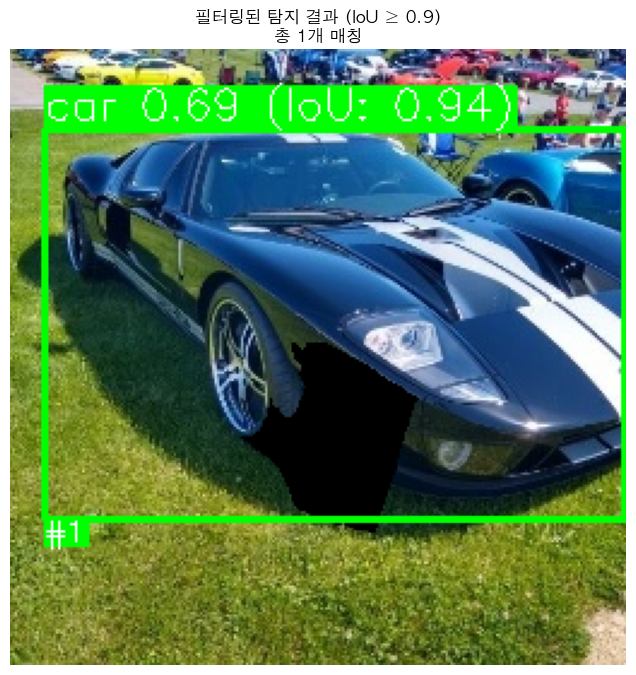


=== 필터링 결과 요약 ===
원본 선택 객체: car (바운딩 박스: [18.248022079467773, 32.683998107910156, 255.5966339111328, 188.97933959960938])
필터링된 객체 수: 1
평균 IoU: 0.943
  매칭 #1: car 0.69 (신뢰도: 0.69, IoU: 0.943)


In [30]:
if filtered_results:
    filtered_boxes = [result['box'] for result in filtered_results]
    filtered_colors = [(0, 255, 0) for _ in filtered_results]  # 녹색으로 표시
    filtered_names = [f"{result['class_name']} (IoU: {result['iou']:.2f})" for result in filtered_results]
    
    # 필터링된 결과만 시각화
    filtered_visualization = masked_img.copy()
    filtered_visualization = draw_detections(
        boxes=filtered_boxes,
        colors=filtered_colors,
        names=filtered_names,
        image=filtered_visualization,
        indices=filtered_indices
    )
        # 결과 표시
    plt.figure(figsize=(12, 8))
    plt.imshow(filtered_visualization)
    plt.title(f"필터링된 탐지 결과 (IoU ≥ {iou_threshold})\n총 {len(filtered_results)}개 매칭")
    plt.axis('off')
    plt.show()
    
    print(f"\n=== 필터링 결과 요약 ===")
    print(f"원본 선택 객체: {final_target_class_name} (바운딩 박스: {final_target_bbox_xyxy})")
    print(f"필터링된 객체 수: {len(filtered_results)}")
    print(f"평균 IoU: {np.mean([r['iou'] for r in filtered_results]):.3f}")
    
    for i, result in enumerate(filtered_results):
        print(f"  매칭 #{i+1}: {result['class_name']} (신뢰도: {result['confidence']:.2f}, IoU: {result['iou']:.3f})")
        
else:
    print(f"IoU 임계값 {iou_threshold}을 만족하는 탐지 결과가 없습니다.")
    
    # 전체 마스킹 결과 시각화
    all_visualization = masked_img.copy()
    all_visualization = draw_detections(
        boxes=masked_boxes,
        colors=masked_colors,
        names=masked_names,
        image=all_visualization,
        indices=masked_indices
    )
    
    plt.figure(figsize=(12, 8))
    plt.imshow(all_visualization)
    plt.title(f"전체 마스킹 탐지 결과 (필터링 없음)\n총 {len(masked_boxes)}개 탐지")
    plt.axis('off')
    plt.show()

* 원본 이미지 예측과 마스킹 이미지 예측 결과 비교


--- 신뢰도 비교 분석 ---
원본 선택 객체:
  - 클래스: car
  - 신뢰도: 0.7914
  - 바운딩 박스: [18.248022079467773, 32.683998107910156, 255.5966339111328, 188.97933959960938]

마스킹된 이미지 필터링 결과 (IoU ≥ 0.9):
  매칭 #1:
    - 클래스: car
    - 신뢰도: 0.6917
    - IoU: 0.9428
    - 신뢰도 차이: -0.0996 (-9.96%)
    - 신뢰도 비율: 0.8741
    - 해석: 신뢰도 감소 (마스킹 영향 있음)

=== 신뢰도 통계 요약 ===
원본 신뢰도: 0.7914
마스킹 평균 신뢰도: 0.6917
마스킹 최대 신뢰도: 0.6917
마스킹 최소 신뢰도: 0.6917
평균 신뢰도 변화: -0.0996 (-9.96%)


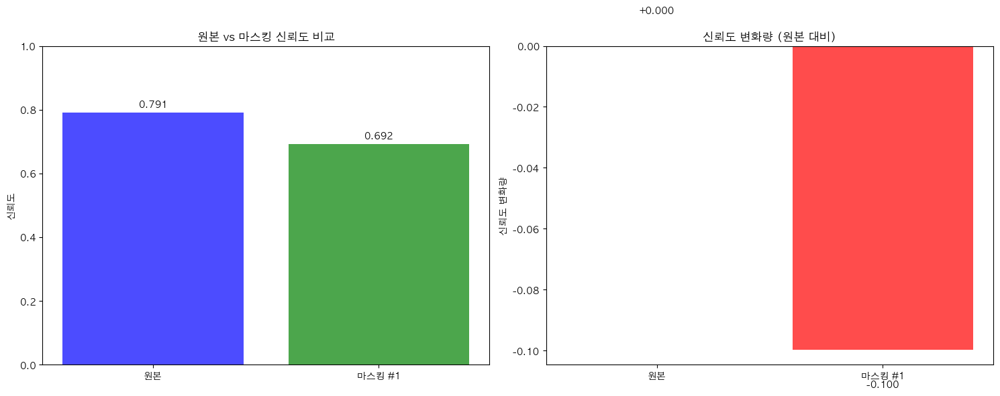

In [ ]:
# 원본 추론 결과와 마스킹된 이미지 결과의 신뢰도 비교
print("\n--- 신뢰도 비교 분석 ---")

# 원본 선택 객체의 신뢰도
original_confidence = final_target_conf
original_class_name = final_target_class_name

print(f"원본 선택 객체:")
print(f"  - 클래스: {original_class_name}")
print(f"  - 신뢰도: {original_confidence:.4f}")
print(f"  - 바운딩 박스: {final_target_bbox_xyxy}")

# 마스킹된 이미지의 필터링된 결과들
if filtered_results:
    print(f"\n마스킹된 이미지 필터링 결과 (IoU ≥ {iou_threshold}):")
    
    for i, result in enumerate(filtered_results):
        masked_confidence = result['confidence']
        confidence_diff = masked_confidence - original_confidence
        confidence_ratio = masked_confidence / original_confidence if original_confidence > 0 else 0
        
        # 클래스명에서 신뢰도 제거 (예: "car 0.81" -> "car")
        clean_class_name = result['class_name'].split()[0] if ' ' in result['class_name'] else result['class_name']
        
        print(f"  매칭 #{i+1}:")
        print(f"    - 클래스: {clean_class_name}")
        print(f"    - 신뢰도: {masked_confidence:.4f}")
        print(f"    - IoU: {result['iou']:.4f}")
        print(f"    - 신뢰도 차이: {confidence_diff:+.4f} ({confidence_diff*100:+.2f}%)")
        print(f"    - 신뢰도 비율: {confidence_ratio:.4f}")
        
        # 신뢰도 변화에 따른 해석
        if confidence_diff > 0.1:
            print(f"    - 해석: 신뢰도 크게 증가 (마스킹 효과 양호)")
        elif confidence_diff > 0.05:
            print(f"    - 해석: 신뢰도 증가 (마스킹 효과 있음)")
        elif confidence_diff > -0.05:
            print(f"    - 해석: 신뢰도 유지 (마스킹 영향 적음)")
        elif confidence_diff > -0.1:
            print(f"    - 해석: 신뢰도 감소 (마스킹 영향 있음)")
        else:
            print(f"    - 해석: 신뢰도 크게 감소 (마스킹 효과 부정적)")
    
    # 통계 요약
    masked_confidences = [r['confidence'] for r in filtered_results]
    avg_confidence = np.mean(masked_confidences)
    max_confidence = np.max(masked_confidences)
    min_confidence = np.min(masked_confidences)
    
    print(f"\n=== 신뢰도 통계 요약 ===")
    print(f"원본 신뢰도: {original_confidence:.4f}")
    print(f"마스킹 평균 신뢰도: {avg_confidence:.4f}")
    print(f"마스킹 최대 신뢰도: {max_confidence:.4f}")
    print(f"마스킹 최소 신뢰도: {min_confidence:.4f}")
    print(f"평균 신뢰도 변화: {avg_confidence - original_confidence:+.4f} ({(avg_confidence - original_confidence)*100:+.2f}%)")
    
    # 시각화
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # 1. 신뢰도 비교 막대 그래프
    labels = ['원본'] + [f'마스킹 #{i+1}' for i in range(len(filtered_results))]
    confidences = [original_confidence] + masked_confidences
    colors = ['blue'] + ['green'] * len(filtered_results)
    
    bars = ax1.bar(labels, confidences, color=colors, alpha=0.7)
    ax1.set_ylabel('신뢰도')
    ax1.set_title('원본 vs 마스킹 신뢰도 비교')
    ax1.set_ylim(0, 1)
    
    # 막대 위에 값 표시
    for bar, conf in zip(bars, confidences):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{conf:.3f}', ha='center', va='bottom', fontweight='bold')
    
    # 2. 신뢰도 변화량
    confidence_changes = [0] + [r['confidence'] - original_confidence for r in filtered_results]
    change_colors = ['gray'] + ['red' if c < 0 else 'green' for c in confidence_changes[1:]]
    
    bars2 = ax2.bar(labels, confidence_changes, color=change_colors, alpha=0.7)
    ax2.set_ylabel('신뢰도 변화량')
    ax2.set_title('신뢰도 변화량 (원본 대비)')
    ax2.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    
    # 막대 위에 값 표시
    for bar, change in zip(bars2, confidence_changes):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height + (0.01 if height >= 0 else -0.01),
                f'{change:+.3f}', ha='center', va='bottom' if height >= 0 else 'top', fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
else:
    print("필터링된 결과가 없어서 신뢰도 비교를 할 수 없습니다.")

### PERTURBATION

superpixel masking 전후 예측값 변동 측정 및 취합
> 모든 영역에 대한 마스킹 이미지 예측 수행<br>
> 마스킹 영역에 따른 컨피던스 및 IoU 변동 관측<br>
> 변화율에 따른 가중치 부여, 각 슈퍼픽셀의 기여도 측정


--- 모든 슈퍼픽셀 SHAP 분석 (최고 IoU 기준) ---
전체 슈퍼픽셀 수: 24

--- 슈퍼픽셀 #1/24 (ID: 1) ---
  ✓ 최고 IoU: car (신뢰도: 0.777, IoU: 0.992)

--- 슈퍼픽셀 #2/24 (ID: 2) ---
  ✓ 최고 IoU: car (신뢰도: 0.809, IoU: 0.988)

--- 슈퍼픽셀 #3/24 (ID: 3) ---
  ✓ 최고 IoU: car (신뢰도: 0.785, IoU: 0.997)

--- 슈퍼픽셀 #4/24 (ID: 4) ---
  ✓ 최고 IoU: car (신뢰도: 0.812, IoU: 0.993)

--- 슈퍼픽셀 #5/24 (ID: 5) ---
  ✓ 최고 IoU: car (신뢰도: 0.539, IoU: 0.968)

--- 슈퍼픽셀 #6/24 (ID: 6) ---
  ✓ 최고 IoU: car (신뢰도: 0.883, IoU: 0.980)

--- 슈퍼픽셀 #7/24 (ID: 7) ---
  ✓ 최고 IoU: car (신뢰도: 0.767, IoU: 0.985)

--- 슈퍼픽셀 #8/24 (ID: 8) ---
  ✓ 최고 IoU: car (신뢰도: 0.808, IoU: 0.991)

--- 슈퍼픽셀 #9/24 (ID: 9) ---
  ✓ 최고 IoU: car (신뢰도: 0.755, IoU: 0.882)

--- 슈퍼픽셀 #10/24 (ID: 10) ---
  ✓ 최고 IoU: car (신뢰도: 0.795, IoU: 0.993)

--- 슈퍼픽셀 #11/24 (ID: 11) ---
  ✓ 최고 IoU: car (신뢰도: 0.769, IoU: 0.995)

--- 슈퍼픽셀 #12/24 (ID: 12) ---
  ✓ 최고 IoU: car (신뢰도: 0.725, IoU: 0.937)

--- 슈퍼픽셀 #13/24 (ID: 13) ---
  ✓ 최고 IoU: car (신뢰도: 0.767, IoU: 0.947)

--- 슈퍼픽셀 #14/24 (ID: 14) ---
  ✓ 최고 IoU: ca

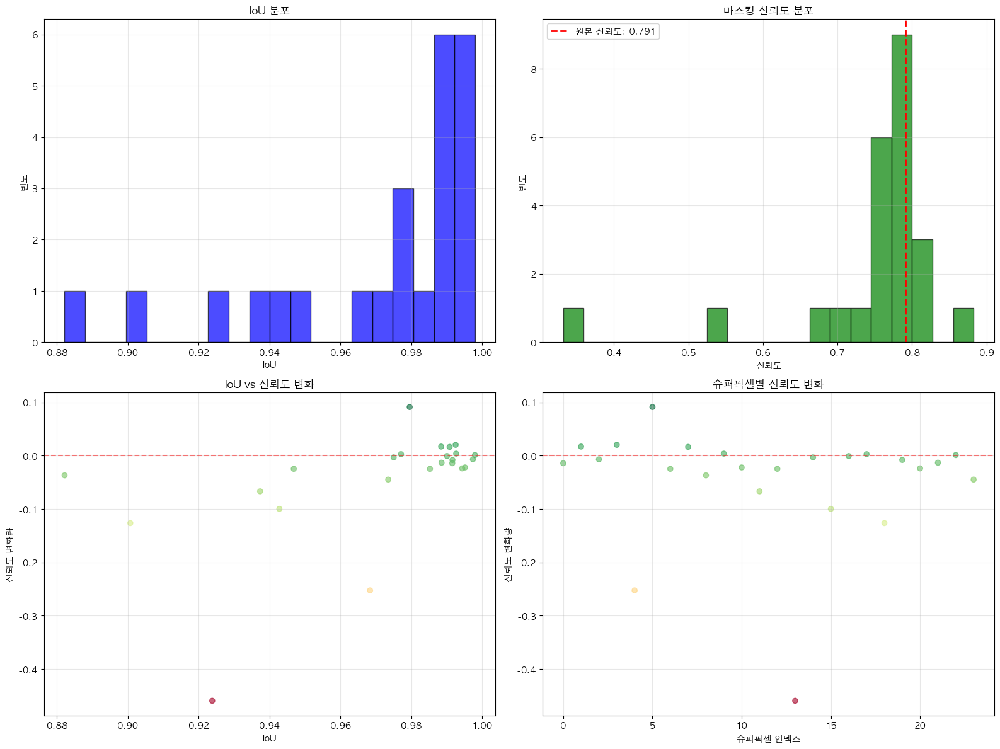


=== 영향력 분석 ===

신뢰도 변화율 절댓값 상위 5개 슈퍼픽셀:
  #1: 슈퍼픽셀 ID 14 (변화율: -58.07%, 변화량: -0.4595, IoU: 0.924)
  #2: 슈퍼픽셀 ID 5 (변화율: -31.90%, 변화량: -0.2525, IoU: 0.968)
  #3: 슈퍼픽셀 ID 19 (변화율: -15.97%, 변화량: -0.1264, IoU: 0.901)
  #4: 슈퍼픽셀 ID 16 (변화율: -12.59%, 변화량: -0.0996, IoU: 0.943)
  #5: 슈퍼픽셀 ID 6 (변화율: +11.54%, 변화량: +0.0913, IoU: 0.980)

신뢰도 증가 상위 5개 슈퍼픽셀:
  #1: 슈퍼픽셀 ID 6 (변화: +0.0913, IoU: 0.980)
  #2: 슈퍼픽셀 ID 4 (변화: +0.0204, IoU: 0.993)
  #3: 슈퍼픽셀 ID 2 (변화: +0.0172, IoU: 0.988)
  #4: 슈퍼픽셀 ID 8 (변화: +0.0166, IoU: 0.991)
  #5: 슈퍼픽셀 ID 10 (변화: +0.0040, IoU: 0.993)

신뢰도 감소 상위 5개 슈퍼픽셀:
  #1: 슈퍼픽셀 ID 14 (변화: -0.4595, IoU: 0.924)
  #2: 슈퍼픽셀 ID 5 (변화: -0.2525, IoU: 0.968)
  #3: 슈퍼픽셀 ID 19 (변화: -0.1264, IoU: 0.901)
  #4: 슈퍼픽셀 ID 16 (변화: -0.0996, IoU: 0.943)
  #5: 슈퍼픽셀 ID 12 (변화: -0.0667, IoU: 0.937)

IoU 상위 5개 슈퍼픽셀:
  #1: 슈퍼픽셀 ID 23 (IoU: 0.998, 신뢰도 변화: +0.0013)
  #2: 슈퍼픽셀 ID 3 (IoU: 0.997, 신뢰도 변화: -0.0068)
  #3: 슈퍼픽셀 ID 11 (IoU: 0.995, 신뢰도 변화: -0.0220)
  #4: 슈퍼픽셀 ID 21 (IoU: 0.994, 신뢰도 변화: -0.0237)
  

In [51]:
# 모든 슈퍼픽셀에 대한 SHAP 분석 수행 (최고 IoU 기준)
print("\n--- 모든 슈퍼픽셀 SHAP 분석 (최고 IoU 기준) ---")

# 전체 슈퍼픽셀 정보
unique_segments = np.unique(segments)
total_superpixels = len(unique_segments)
print(f"전체 슈퍼픽셀 수: {total_superpixels}")

# 결과 저장을 위한 리스트
all_results = []

# 각 슈퍼픽셀에 대해 분석 수행
for i, segment_id in enumerate(unique_segments):
    print(f"\n--- 슈퍼픽셀 #{i+1}/{total_superpixels} (ID: {segment_id}) ---")
    
    # 1. 현재 슈퍼픽셀만 마스킹
    current_masked_img = mask_superpixels(original_img_rgb, segments, [segment_id], mask_value=0)
    
    # 2. 마스킹된 이미지로 추론
    try:
        masked_results = model(current_masked_img)
        masked_boxes, masked_colors, masked_names, masked_indices = parse_detections(masked_results)
        
        if len(masked_boxes) == 0:
            print(f"  ✗ 탐지된 객체 없음")
            continue
        
        # 3. 원본 선택 객체와 모든 탐지 결과의 IoU 계산
        best_match = None
        best_iou = 0
        
        for j, masked_box in enumerate(masked_boxes):
            iou = calculate_iou(masked_box, final_target_bbox_xyxy)
            
            if iou > best_iou:
                best_iou = iou
                # 클래스명에서 신뢰도 제거
                clean_class_name = masked_names[j].split()[0] if ' ' in masked_names[j] else masked_names[j]
                confidence = masked_results[0].boxes[j].conf.item() if j < len(masked_results[0].boxes) else 0.0
                
                best_match = {
                    'segment_id': segment_id,
                    'segment_index': i,
                    'box': masked_box,
                    'class_name': clean_class_name,
                    'confidence': confidence,
                    'iou': iou
                }
        
        # 4. 최고 IoU 결과 저장 (임계값 무관)
        if best_match:
            all_results.append(best_match)
            print(f"  ✓ 최고 IoU: {best_match['class_name']} (신뢰도: {best_match['confidence']:.3f}, IoU: {best_match['iou']:.3f})")
        else:
            print(f"  ✗ 매칭 결과 없음")
            
    except Exception as e:
        print(f"  ✗ 오류 발생: {str(e)}")
        continue

# 전체 결과 분석
print(f"\n=== 전체 분석 결과 요약 ===")
print(f"분석된 슈퍼픽셀 수: {len(all_results)}/{total_superpixels}")
print(f"매칭된 슈퍼픽셀 비율: {len(all_results)/total_superpixels*100:.1f}%")

if all_results:
    # IoU 통계
    ious = [r['iou'] for r in all_results]
    print(f"\nIoU 분석:")
    print(f"평균 IoU: {np.mean(ious):.4f}")
    print(f"최대 IoU: {np.max(ious):.4f}")
    print(f"최소 IoU: {np.min(ious):.4f}")
    print(f"IoU 표준편차: {np.std(ious):.4f}")
    
    # 신뢰도 통계
    confidences = [r['confidence'] for r in all_results]
    original_conf = final_target_conf
    
    print(f"\n신뢰도 분석:")
    print(f"원본 신뢰도: {original_conf:.4f}")
    print(f"평균 마스킹 신뢰도: {np.mean(confidences):.4f}")
    print(f"최대 마스킹 신뢰도: {np.max(confidences):.4f}")
    print(f"최소 마스킹 신뢰도: {np.min(confidences):.4f}")
    print(f"평균 신뢰도 변화: {np.mean(confidences) - original_conf:+.4f}")
    
    # 신뢰도 변화 분포
    confidence_changes = [conf - original_conf for conf in confidences]
    positive_changes = sum(1 for c in confidence_changes if c > 0)
    negative_changes = sum(1 for c in confidence_changes if c < 0)
    no_changes = sum(1 for c in confidence_changes if abs(c) < 0.01)
    
    print(f"\n신뢰도 변화 분포:")
    print(f"신뢰도 증가: {positive_changes}개 ({positive_changes/len(confidences)*100:.1f}%)")
    print(f"신뢰도 감소: {negative_changes}개 ({negative_changes/len(confidences)*100:.1f}%)")
    print(f"신뢰도 유지: {no_changes}개 ({no_changes/len(confidences)*100:.1f}%)")
    
    # 시각화
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
    
    # 1. IoU 분포 히스토그램
    ax1.hist(ious, bins=20, alpha=0.7, color='blue', edgecolor='black')
    ax1.set_xlabel('IoU')
    ax1.set_ylabel('빈도')
    ax1.set_title('IoU 분포')
    ax1.grid(True, alpha=0.3)
    
    # 2. 신뢰도 분포 히스토그램
    ax2.hist(confidences, bins=20, alpha=0.7, color='green', edgecolor='black')
    ax2.axvline(original_conf, color='red', linestyle='--', linewidth=2, label=f'원본 신뢰도: {original_conf:.3f}')
    ax2.set_xlabel('신뢰도')
    ax2.set_ylabel('빈도')
    ax2.set_title('마스킹 신뢰도 분포')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # 3. IoU vs 신뢰도 변화
    ax3.scatter(ious, confidence_changes, alpha=0.6, c=confidence_changes, cmap='RdYlGn')
    ax3.axhline(0, color='red', linestyle='--', alpha=0.5)
    ax3.set_xlabel('IoU')
    ax3.set_ylabel('신뢰도 변화량')
    ax3.set_title('IoU vs 신뢰도 변화')
    ax3.grid(True, alpha=0.3)
    
    # 4. 슈퍼픽셀별 신뢰도 변화
    segment_indices = [r['segment_index'] for r in all_results]
    ax4.scatter(segment_indices, confidence_changes, alpha=0.6, c=confidence_changes, cmap='RdYlGn')
    ax4.axhline(0, color='red', linestyle='--', alpha=0.5)
    ax4.set_xlabel('슈퍼픽셀 인덱스')
    ax4.set_ylabel('신뢰도 변화량')
    ax4.set_title('슈퍼픽셀별 신뢰도 변화')
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # 상위/하위 영향 슈퍼픽셀 출력
    print(f"\n=== 영향력 분석 ===")

    # 신뢰도 변화량 기준 상위 5개 슈퍼픽셀
    print(f"\n신뢰도 변화율 절댓값 상위 5개 슈퍼픽셀:")
    top_abs_change_rate = sorted(all_results, key=lambda x: abs((x['confidence'] - original_conf) / original_conf), reverse=True)[:5]
    for i, result in enumerate(top_abs_change_rate):
        change = result['confidence'] - original_conf
        change_rate = (change / original_conf) * 100  # 퍼센트로 변환
        print(f"  #{i+1}: 슈퍼픽셀 ID {result['segment_id']} (변화율: {change_rate:+.2f}%, 변화량: {change:+.4f}, IoU: {result['iou']:.3f})")
    
    # 신뢰도 증가가 가장 큰 슈퍼픽셀 (상위 5개)
    top_positive = sorted(all_results, key=lambda x: x['confidence'] - original_conf, reverse=True)[:5]
    print(f"\n신뢰도 증가 상위 5개 슈퍼픽셀:")
    for i, result in enumerate(top_positive):
        change = result['confidence'] - original_conf
        print(f"  #{i+1}: 슈퍼픽셀 ID {result['segment_id']} (변화: {change:+.4f}, IoU: {result['iou']:.3f})")
    
    # 신뢰도 감소가 가장 큰 슈퍼픽셀 (상위 5개)
    top_negative = sorted(all_results, key=lambda x: original_conf - x['confidence'], reverse=True)[:5]
    print(f"\n신뢰도 감소 상위 5개 슈퍼픽셀:")
    for i, result in enumerate(top_negative):
        change = result['confidence'] - original_conf
        print(f"  #{i+1}: 슈퍼픽셀 ID {result['segment_id']} (변화: {change:+.4f}, IoU: {result['iou']:.3f})")
    
    # IoU가 가장 높은 슈퍼픽셀 (상위 5개)
    top_iou = sorted(all_results, key=lambda x: x['iou'], reverse=True)[:5]
    print(f"\nIoU 상위 5개 슈퍼픽셀:")
    for i, result in enumerate(top_iou):
        change = result['confidence'] - original_conf
        print(f"  #{i+1}: 슈퍼픽셀 ID {result['segment_id']} (IoU: {result['iou']:.3f}, 신뢰도 변화: {change:+.4f})")
    
else:
    print("매칭된 슈퍼픽셀이 없습니다.")


--- IoU 최저 마스킹 이미지 vs 원본 타겟 객체 바운딩 박스 비교 ---
IoU 최저 슈퍼픽셀 정보:
  - 슈퍼픽셀 ID: 9
  - IoU: 0.8822


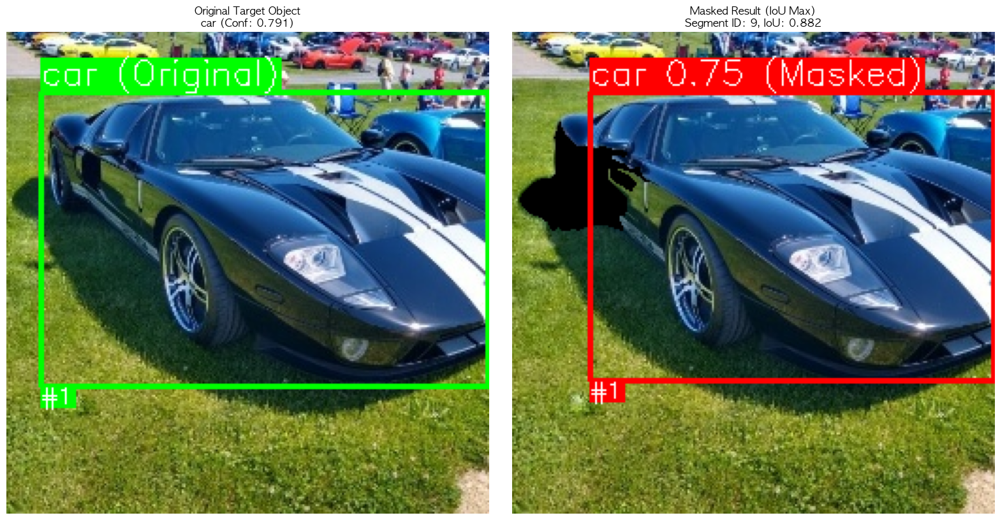


=== 바운딩 박스 좌표 비교 ===
원본 타겟 객체:
  - 바운딩 박스: [18.248022079467773, 32.683998107910156, 255.5966339111328, 188.97933959960938]
  - 크기: 237.34861183166504 x 156.29534149169922 픽셀

마스킹 결과에서 IoU 최대 객체:
  - 바운딩 박스: [     41.815      32.735      255.87      185.99]
  - 크기: 214.05430603027344 x 153.25347900390625 픽셀
  - IoU: 0.8822
  - 중심점 차이: (+11.9, -1.5) 픽셀
  - 크기 차이: 너비 -23.3, 높이 -3.0 픽셀


In [46]:
# IoU가 가장 낮은 마스킹 이미지와 원본 타겟 객체 바운딩 박스 비교
print("\n--- IoU 최저 마스킹 이미지 vs 원본 타겟 객체 바운딩 박스 비교 ---")

if all_results:
    # IoU가 가장 낮은 결과 찾기
    lowest_iou_result = min(all_results, key=lambda x: x['iou'])
    lowest_segment_id = lowest_iou_result['segment_id']
    lowest_iou = lowest_iou_result['iou']
    
    print(f"IoU 최저 슈퍼픽셀 정보:")
    print(f"  - 슈퍼픽셀 ID: {lowest_segment_id}")
    print(f"  - IoU: {lowest_iou:.4f}")
    
    # 1. IoU 최저 슈퍼픽셀 마스킹 이미지 생성
    lowest_masked_img = mask_superpixels(original_img_rgb, segments, [lowest_segment_id], mask_value=0)
    
    # 2. 마스킹된 이미지로 추론
    lowest_masked_results = model(lowest_masked_img)
    lowest_masked_boxes, lowest_masked_colors, lowest_masked_names, lowest_masked_indices = parse_detections(lowest_masked_results)
    
    # 3. 마스킹 결과에서 IoU가 최대인 바운딩 박스 찾기
    best_masked_match = None
    best_masked_iou = 0
    
    for i, masked_box in enumerate(lowest_masked_boxes):
        iou = calculate_iou(masked_box, final_target_bbox_xyxy)
        if iou > best_masked_iou:
            best_masked_iou = iou
            best_masked_match = {
                'index': i,
                'box': masked_box,
                'name': lowest_masked_names[i],
                'confidence': lowest_masked_results[0].boxes[i].conf.item() if i < len(lowest_masked_results[0].boxes) else 0.0,
                'iou': iou
            }
    
    # 4. 시각화
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    # 원본 타겟 객체 바운딩 박스 (영어로 표시)
    original_vis = original_img_rgb.copy()
    original_vis = draw_detections(
        boxes=[final_target_bbox_xyxy],
        colors=[(0, 255, 0)],  # 녹색
        names=[f"{final_target_class_name} (Original)"],  # 영어로 변경
        image=original_vis,
        indices=[target_object_display_index]
    )
    ax1.imshow(original_vis)
    ax1.set_title(f'Original Target Object\n{final_target_class_name} (Conf: {final_target_conf:.3f})', 
                  fontsize=12, fontweight='bold')
    ax1.axis('off')
    
    # 마스킹된 이미지 추론 결과 (IoU 최대인 것만)
    if best_masked_match:
        lowest_masked_vis = lowest_masked_img.copy()
        lowest_masked_vis = draw_detections(
            boxes=[best_masked_match['box']],
            colors=[(255, 0, 0)],  # 빨간색
            names=[f"{best_masked_match['name']} (Masked)"],  # 영어로 변경
            image=lowest_masked_vis,
            indices=[best_masked_match['index']]
        )
        ax2.imshow(lowest_masked_vis)
        ax2.set_title(f'Masked Result (IoU Max)\nSegment ID: {lowest_segment_id}, IoU: {best_masked_match["iou"]:.3f}', 
                      fontsize=12, fontweight='bold')
    else:
        ax2.imshow(lowest_masked_img)
        ax2.set_title(f'Masked Image (No Detection)\nSegment ID: {lowest_segment_id}', 
                      fontsize=12, fontweight='bold')
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # 5. 바운딩 박스 좌표 비교
    print(f"\n=== 바운딩 박스 좌표 비교 ===")
    print(f"원본 타겟 객체:")
    print(f"  - 바운딩 박스: {final_target_bbox_xyxy}")
    print(f"  - 크기: {final_target_bbox_xyxy[2] - final_target_bbox_xyxy[0]} x {final_target_bbox_xyxy[3] - final_target_bbox_xyxy[1]} 픽셀")
    
    if best_masked_match:
        print(f"\n마스킹 결과에서 IoU 최대 객체:")
        print(f"  - 바운딩 박스: {best_masked_match['box']}")
        print(f"  - 크기: {best_masked_match['box'][2] - best_masked_match['box'][0]} x {best_masked_match['box'][3] - best_masked_match['box'][1]} 픽셀")
        print(f"  - IoU: {best_masked_match['iou']:.4f}")
        
        # 위치 차이 계산
        orig_center_x = (final_target_bbox_xyxy[0] + final_target_bbox_xyxy[2]) / 2
        orig_center_y = (final_target_bbox_xyxy[1] + final_target_bbox_xyxy[3]) / 2
        masked_center_x = (best_masked_match['box'][0] + best_masked_match['box'][2]) / 2
        masked_center_y = (best_masked_match['box'][1] + best_masked_match['box'][3]) / 2
        
        center_diff_x = masked_center_x - orig_center_x
        center_diff_y = masked_center_y - orig_center_y
        
        print(f"  - 중심점 차이: ({center_diff_x:+.1f}, {center_diff_y:+.1f}) 픽셀")
        
        # 크기 차이 계산
        orig_width = final_target_bbox_xyxy[2] - final_target_bbox_xyxy[0]
        orig_height = final_target_bbox_xyxy[3] - final_target_bbox_xyxy[1]
        masked_width = best_masked_match['box'][2] - best_masked_match['box'][0]
        masked_height = best_masked_match['box'][3] - best_masked_match['box'][1]
        
        width_diff = masked_width - orig_width
        height_diff = masked_height - orig_height
        
        print(f"  - 크기 차이: 너비 {width_diff:+.1f}, 높이 {height_diff:+.1f} 픽셀")
        
    else:
        print(f"\n마스킹 결과에서 유사한 객체를 찾을 수 없습니다.")
    
else:
    print("분석 결과가 없어서 비교할 수 없습니다.")


--- 신뢰도 변화 최대 마스킹 이미지 vs 원본 타겟 객체 바운딩 박스 비교 ---
신뢰도 변화 최대 슈퍼픽셀 정보:
  - 슈퍼픽셀 ID: 14
  - 신뢰도 변화: -0.4595
  - 원본 신뢰도: 0.7914
  - 마스킹 신뢰도: 0.3318
  - IoU: 0.9238


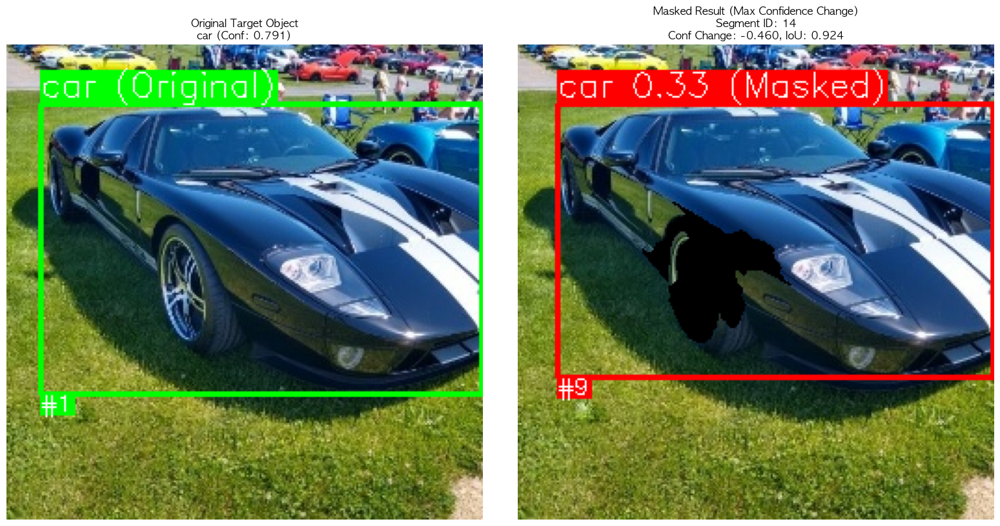


=== 바운딩 박스 좌표 비교 ===
원본 타겟 객체:
  - 바운딩 박스: [18.248022079467773, 32.683998107910156, 255.5966339111328, 188.97933959960938]
  - 크기: 237.34861183166504 x 156.29534149169922 픽셀

마스킹 결과에서 IoU 최대 객체:
  - 바운딩 박스: [     21.391      32.595      255.69      179.15]
  - 크기: 234.30068969726562 x 146.5551300048828 픽셀
  - IoU: 0.9238
  - 신뢰도: 0.3318
  - 중심점 차이: (+1.6, -5.0) 픽셀
  - 크기 차이: 너비 -3.0, 높이 -9.7 픽셀
  - 해석: 이 슈퍼픽셀 제거 시 신뢰도 크게 감소 (강한 부정적 영향)


In [47]:
# 신뢰도 변화가 가장 큰 마스킹 이미지와 원본 타겟 객체 바운딩 박스 비교
print("\n--- 신뢰도 변화 최대 마스킹 이미지 vs 원본 타겟 객체 바운딩 박스 비교 ---")

if all_results:
    # 신뢰도 변화가 가장 큰 결과 찾기
    original_conf = final_target_conf
    max_confidence_change_result = max(all_results, key=lambda x: abs(x['confidence'] - original_conf))
    max_change_segment_id = max_confidence_change_result['segment_id']
    max_change_confidence = max_confidence_change_result['confidence']
    max_change_iou = max_confidence_change_result['iou']
    confidence_change = max_change_confidence - original_conf
    
    print(f"신뢰도 변화 최대 슈퍼픽셀 정보:")
    print(f"  - 슈퍼픽셀 ID: {max_change_segment_id}")
    print(f"  - 신뢰도 변화: {confidence_change:+.4f}")
    print(f"  - 원본 신뢰도: {original_conf:.4f}")
    print(f"  - 마스킹 신뢰도: {max_change_confidence:.4f}")
    print(f"  - IoU: {max_change_iou:.4f}")
    
    # 1. 신뢰도 변화 최대 슈퍼픽셀 마스킹 이미지 생성
    max_change_masked_img = mask_superpixels(original_img_rgb, segments, [max_change_segment_id], mask_value=0)
    
    # 2. 마스킹된 이미지로 추론
    max_change_masked_results = model(max_change_masked_img)
    max_change_masked_boxes, max_change_masked_colors, max_change_masked_names, max_change_masked_indices = parse_detections(max_change_masked_results)
    
    # 3. 마스킹 결과에서 IoU가 최대인 바운딩 박스 찾기
    best_masked_match = None
    best_masked_iou = 0
    
    for i, masked_box in enumerate(max_change_masked_boxes):
        iou = calculate_iou(masked_box, final_target_bbox_xyxy)
        if iou > best_masked_iou:
            best_masked_iou = iou
            best_masked_match = {
                'index': i,
                'box': masked_box,
                'name': max_change_masked_names[i],
                'confidence': max_change_masked_results[0].boxes[i].conf.item() if i < len(max_change_masked_results[0].boxes) else 0.0,
                'iou': iou
            }
    
    # 4. 시각화
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    # 원본 타겟 객체 바운딩 박스
    original_vis = original_img_rgb.copy()
    original_vis = draw_detections(
        boxes=[final_target_bbox_xyxy],
        colors=[(0, 255, 0)],  # 녹색
        names=[f"{final_target_class_name} (Original)"],
        image=original_vis,
        indices=[target_object_display_index]
    )
    ax1.imshow(original_vis)
    ax1.set_title(f'Original Target Object\n{final_target_class_name} (Conf: {final_target_conf:.3f})', 
                  fontsize=12, fontweight='bold')
    ax1.axis('off')
    
    # 마스킹된 이미지 추론 결과 (IoU 최대인 것만)
    if best_masked_match:
        max_change_masked_vis = max_change_masked_img.copy()
        max_change_masked_vis = draw_detections(
            boxes=[best_masked_match['box']],
            colors=[(255, 0, 0)],  # 빨간색
            names=[f"{best_masked_match['name']} (Masked)"],
            image=max_change_masked_vis,
            indices=[best_masked_match['index']]
        )
        ax2.imshow(max_change_masked_vis)
        ax2.set_title(f'Masked Result (Max Confidence Change)\nSegment ID: {max_change_segment_id}\nConf Change: {confidence_change:+.3f}, IoU: {best_masked_match["iou"]:.3f}', 
                      fontsize=12, fontweight='bold')
    else:
        ax2.imshow(max_change_masked_img)
        ax2.set_title(f'Masked Image (No Detection)\nSegment ID: {max_change_segment_id}\nConf Change: {confidence_change:+.3f}', 
                      fontsize=12, fontweight='bold')
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # 5. 바운딩 박스 좌표 비교
    print(f"\n=== 바운딩 박스 좌표 비교 ===")
    print(f"원본 타겟 객체:")
    print(f"  - 바운딩 박스: {final_target_bbox_xyxy}")
    print(f"  - 크기: {final_target_bbox_xyxy[2] - final_target_bbox_xyxy[0]} x {final_target_bbox_xyxy[3] - final_target_bbox_xyxy[1]} 픽셀")
    
    if best_masked_match:
        print(f"\n마스킹 결과에서 IoU 최대 객체:")
        print(f"  - 바운딩 박스: {best_masked_match['box']}")
        print(f"  - 크기: {best_masked_match['box'][2] - best_masked_match['box'][0]} x {best_masked_match['box'][3] - best_masked_match['box'][1]} 픽셀")
        print(f"  - IoU: {best_masked_match['iou']:.4f}")
        print(f"  - 신뢰도: {best_masked_match['confidence']:.4f}")
        
        # 위치 차이 계산
        orig_center_x = (final_target_bbox_xyxy[0] + final_target_bbox_xyxy[2]) / 2
        orig_center_y = (final_target_bbox_xyxy[1] + final_target_bbox_xyxy[3]) / 2
        masked_center_x = (best_masked_match['box'][0] + best_masked_match['box'][2]) / 2
        masked_center_y = (best_masked_match['box'][1] + best_masked_match['box'][3]) / 2
        
        center_diff_x = masked_center_x - orig_center_x
        center_diff_y = masked_center_y - orig_center_y
        
        print(f"  - 중심점 차이: ({center_diff_x:+.1f}, {center_diff_y:+.1f}) 픽셀")
        
        # 크기 차이 계산
        orig_width = final_target_bbox_xyxy[2] - final_target_bbox_xyxy[0]
        orig_height = final_target_bbox_xyxy[3] - final_target_bbox_xyxy[1]
        masked_width = best_masked_match['box'][2] - best_masked_match['box'][0]
        masked_height = best_masked_match['box'][3] - best_masked_match['box'][1]
        
        width_diff = masked_width - orig_width
        height_diff = masked_height - orig_height
        
        print(f"  - 크기 차이: 너비 {width_diff:+.1f}, 높이 {height_diff:+.1f} 픽셀")
        
        # 신뢰도 변화 해석
        if confidence_change > 0.1:
            print(f"  - 해석: 이 슈퍼픽셀 제거 시 신뢰도 크게 증가 (긍정적 영향)")
        elif confidence_change > 0.05:
            print(f"  - 해석: 이 슈퍼픽셀 제거 시 신뢰도 증가 (긍정적 영향)")
        elif confidence_change > -0.05:
            print(f"  - 해석: 이 슈퍼픽셀 제거 시 신뢰도 유지 (중립적 영향)")
        elif confidence_change > -0.1:
            print(f"  - 해석: 이 슈퍼픽셀 제거 시 신뢰도 감소 (부정적 영향)")
        else:
            print(f"  - 해석: 이 슈퍼픽셀 제거 시 신뢰도 크게 감소 (강한 부정적 영향)")
        
    else:
        print(f"\n마스킹 결과에서 유사한 객체를 찾을 수 없습니다.")
    
else:
    print("분석 결과가 없어서 비교할 수 없습니다.")


--- 신뢰도 증가 최대 마스킹 이미지 vs 원본 타겟 객체 바운딩 박스 비교 ---
신뢰도 증가 최대 슈퍼픽셀 정보:
  - 슈퍼픽셀 ID: 6
  - 신뢰도 증가: +0.0913
  - 원본 신뢰도: 0.7914
  - 마스킹 신뢰도: 0.8827
  - IoU: 0.9795


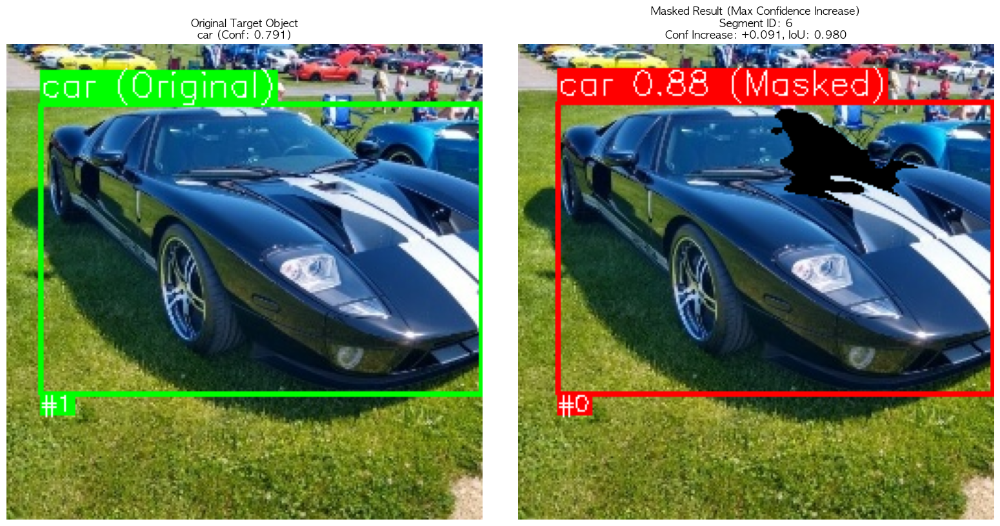


=== 바운딩 박스 좌표 비교 ===
원본 타겟 객체:
  - 바운딩 박스: [18.248022079467773, 32.683998107910156, 255.5966339111328, 188.97933959960938]
  - 크기: 237.34861183166504 x 156.29534149169922 픽셀

마스킹 결과에서 IoU 최대 객체:
  - 바운딩 박스: [      21.11      31.374      255.58      188.94]
  - 크기: 234.4748077392578 x 157.56556701660156 픽셀
  - IoU: 0.9795
  - 신뢰도: 0.8827
  - 중심점 차이: (+1.4, -0.7) 픽셀
  - 크기 차이: 너비 -2.9, 높이 +1.3 픽셀
  - 해석: 이 슈퍼픽셀 제거 시 신뢰도 증가 → 예측에 방해가 되는 특징일 가능성

=== 마스킹 방식 분석 ===
현재 마스킹 방식:
  - 마스킹 값: 0 (검은색)
  - 마스킹 방식: 슈퍼픽셀 단위 제거

마스킹 방식이 결과에 미치는 영향:
1. 마스킹 색상값:
   - 검은색(0): 배경과 유사하여 모델이 해당 영역을 무시할 가능성
   - 흰색(255): 객체와 유사하여 오탐지 유발 가능성
   - 평균값: 주변 픽셀과 유사하여 자연스러운 마스킹
   - 가우시안 노이즈: 더 자연스러운 마스킹 효과

2. 마스킹 방식:
   - 슈퍼픽셀 단위: 의미적 단위로 마스킹
   - 픽셀 단위: 더 정밀한 마스킹
   - 블러 처리: 경계 부드럽게 처리

3. 신뢰도 증가의 의미:
   - 해당 슈퍼픽셀 제거 시 신뢰도 증가 → 모델이 혼란스러워하는 특징
   - 노이즈나 방해 요소일 가능성
   - 다른 클래스와 혼동을 일으키는 특징일 가능성


In [48]:
# 신뢰도 증가가 가장 큰 마스킹 이미지와 원본 타겟 객체 바운딩 박스 비교
print("\n--- 신뢰도 증가 최대 마스킹 이미지 vs 원본 타겟 객체 바운딩 박스 비교 ---")

if all_results:
    # 신뢰도 증가가 가장 큰 결과 찾기
    original_conf = final_target_conf
    max_confidence_increase_result = max(all_results, key=lambda x: x['confidence'] - original_conf)
    max_increase_segment_id = max_confidence_increase_result['segment_id']
    max_increase_confidence = max_confidence_increase_result['confidence']
    max_increase_iou = max_confidence_increase_result['iou']
    confidence_increase = max_increase_confidence - original_conf
    
    print(f"신뢰도 증가 최대 슈퍼픽셀 정보:")
    print(f"  - 슈퍼픽셀 ID: {max_increase_segment_id}")
    print(f"  - 신뢰도 증가: {confidence_increase:+.4f}")
    print(f"  - 원본 신뢰도: {original_conf:.4f}")
    print(f"  - 마스킹 신뢰도: {max_increase_confidence:.4f}")
    print(f"  - IoU: {max_increase_iou:.4f}")
    
    # 1. 신뢰도 증가 최대 슈퍼픽셀 마스킹 이미지 생성
    max_increase_masked_img = mask_superpixels(original_img_rgb, segments, [max_increase_segment_id], mask_value=0)
    
    # 2. 마스킹된 이미지로 추론
    max_increase_masked_results = model(max_increase_masked_img)
    max_increase_masked_boxes, max_increase_masked_colors, max_increase_masked_names, max_increase_masked_indices = parse_detections(max_increase_masked_results)
    
    # 3. 마스킹 결과에서 IoU가 최대인 바운딩 박스 찾기
    best_masked_match = None
    best_masked_iou = 0
    
    for i, masked_box in enumerate(max_increase_masked_boxes):
        iou = calculate_iou(masked_box, final_target_bbox_xyxy)
        if iou > best_masked_iou:
            best_masked_iou = iou
            best_masked_match = {
                'index': i,
                'box': masked_box,
                'name': max_increase_masked_names[i],
                'confidence': max_increase_masked_results[0].boxes[i].conf.item() if i < len(max_increase_masked_results[0].boxes) else 0.0,
                'iou': iou
            }
    
    # 4. 시각화
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    # 원본 타겟 객체 바운딩 박스
    original_vis = original_img_rgb.copy()
    original_vis = draw_detections(
        boxes=[final_target_bbox_xyxy],
        colors=[(0, 255, 0)],  # 녹색
        names=[f"{final_target_class_name} (Original)"],
        image=original_vis,
        indices=[target_object_display_index]
    )
    ax1.imshow(original_vis)
    ax1.set_title(f'Original Target Object\n{final_target_class_name} (Conf: {final_target_conf:.3f})', 
                  fontsize=12, fontweight='bold')
    ax1.axis('off')
    
    # 마스킹된 이미지 추론 결과 (IoU 최대인 것만)
    if best_masked_match:
        max_increase_masked_vis = max_increase_masked_img.copy()
        max_increase_masked_vis = draw_detections(
            boxes=[best_masked_match['box']],
            colors=[(255, 0, 0)],  # 빨간색
            names=[f"{best_masked_match['name']} (Masked)"],
            image=max_increase_masked_vis,
            indices=[best_masked_match['index']]
        )
        ax2.imshow(max_increase_masked_vis)
        ax2.set_title(f'Masked Result (Max Confidence Increase)\nSegment ID: {max_increase_segment_id}\nConf Increase: {confidence_increase:+.3f}, IoU: {best_masked_match["iou"]:.3f}', 
                      fontsize=12, fontweight='bold')
    else:
        ax2.imshow(max_increase_masked_img)
        ax2.set_title(f'Masked Image (No Detection)\nSegment ID: {max_increase_segment_id}\nConf Increase: {confidence_increase:+.3f}', 
                      fontsize=12, fontweight='bold')
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # 5. 바운딩 박스 좌표 비교
    print(f"\n=== 바운딩 박스 좌표 비교 ===")
    print(f"원본 타겟 객체:")
    print(f"  - 바운딩 박스: {final_target_bbox_xyxy}")
    print(f"  - 크기: {final_target_bbox_xyxy[2] - final_target_bbox_xyxy[0]} x {final_target_bbox_xyxy[3] - final_target_bbox_xyxy[1]} 픽셀")
    
    if best_masked_match:
        print(f"\n마스킹 결과에서 IoU 최대 객체:")
        print(f"  - 바운딩 박스: {best_masked_match['box']}")
        print(f"  - 크기: {best_masked_match['box'][2] - best_masked_match['box'][0]} x {best_masked_match['box'][3] - best_masked_match['box'][1]} 픽셀")
        print(f"  - IoU: {best_masked_match['iou']:.4f}")
        print(f"  - 신뢰도: {best_masked_match['confidence']:.4f}")
        
        # 위치 차이 계산
        orig_center_x = (final_target_bbox_xyxy[0] + final_target_bbox_xyxy[2]) / 2
        orig_center_y = (final_target_bbox_xyxy[1] + final_target_bbox_xyxy[3]) / 2
        masked_center_x = (best_masked_match['box'][0] + best_masked_match['box'][2]) / 2
        masked_center_y = (best_masked_match['box'][1] + best_masked_match['box'][3]) / 2
        
        center_diff_x = masked_center_x - orig_center_x
        center_diff_y = masked_center_y - orig_center_y
        
        print(f"  - 중심점 차이: ({center_diff_x:+.1f}, {center_diff_y:+.1f}) 픽셀")
        
        # 크기 차이 계산
        orig_width = final_target_bbox_xyxy[2] - final_target_bbox_xyxy[0]
        orig_height = final_target_bbox_xyxy[3] - final_target_bbox_xyxy[1]
        masked_width = best_masked_match['box'][2] - best_masked_match['box'][0]
        masked_height = best_masked_match['box'][3] - best_masked_match['box'][1]
        
        width_diff = masked_width - orig_width
        height_diff = masked_height - orig_height
        
        print(f"  - 크기 차이: 너비 {width_diff:+.1f}, 높이 {height_diff:+.1f} 픽셀")
        
        # 신뢰도 증가 해석
        print(f"  - 해석: 이 슈퍼픽셀 제거 시 신뢰도 증가 → 예측에 방해가 되는 특징일 가능성")
        
    else:
        print(f"\n마스킹 결과에서 유사한 객체를 찾을 수 없습니다.")
    
else:
    print("분석 결과가 없어서 비교할 수 없습니다.")

# 6. 마스킹 방식에 대한 분석
print(f"\n=== 마스킹 방식 분석 ===")
print(f"현재 마스킹 방식:")
print(f"  - 마스킹 값: 0 (검은색)")
print(f"  - 마스킹 방식: 슈퍼픽셀 단위 제거")

print(f"\n마스킹 방식이 결과에 미치는 영향:")
print(f"1. 마스킹 색상값:")
print(f"   - 검은색(0): 배경과 유사하여 모델이 해당 영역을 무시할 가능성")
print(f"   - 흰색(255): 객체와 유사하여 오탐지 유발 가능성")
print(f"   - 평균값: 주변 픽셀과 유사하여 자연스러운 마스킹")
print(f"   - 가우시안 노이즈: 더 자연스러운 마스킹 효과")

print(f"\n2. 마스킹 방식:")
print(f"   - 슈퍼픽셀 단위: 의미적 단위로 마스킹")
print(f"   - 픽셀 단위: 더 정밀한 마스킹")
print(f"   - 블러 처리: 경계 부드럽게 처리")

print(f"\n3. 신뢰도 증가의 의미:")
print(f"   - 해당 슈퍼픽셀 제거 시 신뢰도 증가 → 모델이 혼란스러워하는 특징")
print(f"   - 노이즈나 방해 요소일 가능성")
print(f"   - 다른 클래스와 혼동을 일으키는 특징일 가능성")

## Backgrounds

이미지 데이터 전처리, 가공 방식에 관하여
> superpixel : 개별 픽셀의 색상값과 경계면, 위치를 기반으로 여러 픽셀을 하나의 거대한 픽셀로 묶어서 해석<br>
> masking algorithms : 영역을 마스킹하는 방식에 따른 예측 결과 변동 추이 관측 (black, white, mean, blur, gausian etc.)

### SUPERPIXEL

In [3]:
import numpy as np

import matplotlib.pyplot as plt
from PIL import Image
import cv2

from skimage.segmentation import slic, quickshift, watershed, felzenszwalb
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
import torch
import torch.nn.functional as F
from torchvision import transforms

import shap

import os
import warnings
warnings.filterwarnings('ignore')

* algorithms

슈퍼픽셀 계산 방식에 따른 알고리즘 별 파라미터 정의

In [4]:
def get_algorithm_params(algorithm, n_segments=50, compactness=10):
    """
    알고리즘별 기본 파라미터를 반환합니다.
    
    Args:
        algorithm: 알고리즘 이름
        n_segments: superpixel 개수
        compactness: 조밀도
    
    Returns:
        dict: 알고리즘별 파라미터
    """
    params = {}
    
    if algorithm.lower() in ['slic', 'slic0']:
        params = {
            'n_segments': n_segments,
            'compactness': compactness,
            'sigma': 1,
            'start_label': 1
        }
        if algorithm.lower() == 'slic0':
            params['slic_zero'] = True
            
    elif algorithm.lower() == 'quickshift':
        params = {
            'kernel_size': 3,
            'max_dist': 6,
            'ratio': 0.5,
            'random_seed': 42
        }
        
    elif algorithm.lower() == 'watershed':
        params = {
            'markers': n_segments,
            'compactness': compactness
        }
        
    elif algorithm.lower() == 'felzenszwalb':
        params = {
            'scale': 1,
            'sigma': 0.8,
            'min_size': 20
        }
    
    return params

* create_superpixels

지정한 알고리즘으로 이미지 슈퍼픽셀 영역 생성

In [5]:
def create_superpixels(image, n_segments=50, compactness=10, algorithm='slic', **kwargs):
    """
    이미지를 superpixel로 분할합니다.
    
    Args:
        image: PIL Image 또는 numpy array
        n_segments: superpixel 개수
        compactness: superpixel의 조밀도 (SLIC, SLIC0에서 사용)
        algorithm: 사용할 알고리즘 ('slic', 'slic0', 'quickshift', 'watershed', 'felzenszwalb')
        **kwargs: 알고리즘별 추가 파라미터
    
    Returns:
        segments: superpixel 라벨 배열
        segmented_image: 경계가 표시된 이미지
    """
    if isinstance(image, Image.Image):
        image = np.array(image)
    
    # 이미지를 float로 변환
    image_float = img_as_float(image)
    
    print(f"Superpixel 분할 시작: {algorithm} 알고리즘 사용")
    print(f"DEBUG: create_superpixels - image_float input shape: {image_float.shape}, dtype: {image_float.dtype}")
    
    if algorithm.lower() == 'slic':
        # SLIC (Simple Linear Iterative Clustering)
        segments = slic(image_float, n_segments=n_segments, compactness=compactness, 
                       sigma=kwargs.get('sigma', 1), start_label=1)
        
    elif algorithm.lower() == 'slic0':
        # SLIC0 (SLIC with zero parameter)
        segments = slic(image_float, n_segments=n_segments, compactness=compactness, 
                       sigma=kwargs.get('sigma', 1), start_label=1, slic_zero=True)
        
    elif algorithm.lower() == 'quickshift':
        # Quickshift
        kernel_size = kwargs.get('kernel_size', 3)
        max_dist = kwargs.get('max_dist', 6)
        ratio = kwargs.get('ratio', 0.5)
        
        segments = quickshift(image_float, kernel_size=kernel_size, max_dist=max_dist, 
                            ratio=ratio)
        
    elif algorithm.lower() == 'watershed':
        # Watershed
        markers = kwargs.get('markers', n_segments)
        compactness = kwargs.get('compactness', compactness)
        
        segments = watershed(image_float, markers=markers, compactness=compactness)
        
    elif algorithm.lower() == 'felzenszwalb':
        # Felzenszwalb
        scale = kwargs.get('scale', 1)
        sigma = kwargs.get('sigma', 0.8)
        min_size = kwargs.get('min_size', 20)
        
        segments = felzenszwalb(image_float, scale=scale, sigma=sigma, min_size=min_size)
        
    else:
        raise ValueError(f"지원하지 않는 알고리즘: {algorithm}. "
                        f"지원되는 알고리즘: 'slic', 'slic0', 'quickshift', 'watershed', 'felzenszwalb'")

    print(f"DEBUG: create_superpixels - segments output shape: {segments.shape}, dtype: {segments.dtype}")
    # 경계 표시
    segmented_image = mark_boundaries(image_float, segments)
    
    print(f"Superpixel 분할 완료: {len(np.unique(segments))}개 영역 생성")
    
    return segments, segmented_image

* mask_superpixels

기여도 계산을 위해 특정 슈퍼픽셀을 원본 이미지에서 마스킹 처리

In [6]:
def mask_superpixels(image, segments, superpixel_indices, mask_value=0):
    """
    특정 superpixel들을 마스킹합니다.
    
    Args:
        image: 원본 이미지
        segments: superpixel 라벨 배열
        superpixel_indices: 마스킹할 superpixel 인덱스 리스트
        mask_value: 마스킹할 값 (기본값: 0)
    
    Returns:
        masked_image: 마스킹된 이미지
    """
    if isinstance(image, Image.Image):
        image = np.array(image)
    
    masked_image = image.copy()
    
    for idx in superpixel_indices:
        mask = segments == idx
        masked_image[mask] = mask_value
    
    return masked_image

* (optional) 슈퍼픽셀 알고리즘 별 결과 비교

In [7]:
def compare_superpixel_algorithms(image, algorithms=['slic', 'quickshift', 'felzenszwalb'], 
                                 n_segments=50, compactness=10, algorithm_kwargs=None):
    """
    다양한 superpixel 알고리즘을 비교합니다.
    
    Args:
        image: 입력 이미지
        algorithms: 비교할 알고리즘 리스트
        n_segments: superpixel 개수 (기본값)
        compactness: 조밀도 (기본값)
        algorithm_kwargs: 알고리즘별 kwargs 딕셔너리
                        예: {
                            'slic': {'n_segments': 100, 'compactness': 20},
                            'quickshift': {'kernel_size': 5, 'max_dist': 10},
                            'felzenszwalb': {'scale': 2, 'min_size': 50}
                        }
    
    Returns:
        dict: 알고리즘별 결과
    """
    if algorithm_kwargs is None:
        algorithm_kwargs = {}
    
    results = {}
    
    fig, axes = plt.subplots(2, len(algorithms), figsize=(5*len(algorithms), 10))
    if len(algorithms) == 1:
        axes = axes.reshape(2, 1)
    
    for i, algorithm in enumerate(algorithms):
        print(f"\n{algorithm.upper()} 알고리즘 테스트 중...")
        
        try:
            # 알고리즘별 파라미터 가져오기
            if algorithm in algorithm_kwargs:
                # 사용자 지정 kwargs 사용
                params = algorithm_kwargs[algorithm]
                print(f"  사용자 지정 파라미터 사용: {params}")
            else:
                # 기본 파라미터 사용
                params = get_algorithm_params(algorithm, n_segments, compactness)
                print(f"  기본 파라미터 사용: {params}")
            
            # Superpixel 분할
            segments, segmented_image = create_superpixels(image, algorithm=algorithm, **params)
            
            # 결과 저장
            results[algorithm] = {
                'segments': segments,
                'segmented_image': segmented_image,
                'n_regions': len(np.unique(segments)),
                'params': params,
                'algorithm': algorithm
            }
            
            # 시각화
            axes[0, i].imshow(image)
            axes[0, i].set_title(f'원본 이미지\n{algorithm.upper()}', fontsize=12)
            axes[0, i].axis('off')
            
            axes[1, i].imshow(segmented_image)
            axes[1, i].set_title(f'{algorithm.upper()}\n{results[algorithm]["n_regions"]}개 영역\n{params}', fontsize=10)
            axes[1, i].axis('off')
            
            print(f"  생성된 영역 수: {results[algorithm]['n_regions']}")
            
        except Exception as e:
            print(f"  {algorithm} 알고리즘 실행 실패: {e}")
            axes[0, i].text(0.5, 0.5, f'{algorithm}\n실패', ha='center', va='center', transform=axes[0, i].transAxes)
            axes[1, i].text(0.5, 0.5, f'{algorithm}\n실패', ha='center', va='center', transform=axes[1, i].transAxes)
    
    plt.tight_layout()
    plt.show()
    
    return results

* (optional) 알고리즘 결과값에 대한 특성 비교 분석

In [8]:
def analyze_superpixel_characteristics(segments, algorithm_name):
    """
    Superpixel 분할 결과의 특성을 분석합니다.
    
    Args:
        segments: superpixel 라벨 배열
        algorithm_name: 알고리즘 이름
    
    Returns:
        dict: 특성 분석 결과
    """
    unique_segments = np.unique(segments)
    n_regions = len(unique_segments)
    
    # 각 superpixel의 크기 계산
    region_sizes = []
    for segment_idx in unique_segments:
        size = np.sum(segments == segment_idx)
        region_sizes.append(size)
    
    region_sizes = np.array(region_sizes)
    
    # 특성 계산
    characteristics = {
        'algorithm': algorithm_name,
        'n_regions': n_regions,
        'mean_size': np.mean(region_sizes),
        'std_size': np.std(region_sizes),
        'min_size': np.min(region_sizes),
        'max_size': np.max(region_sizes),
        'size_ratio': np.max(region_sizes) / np.min(region_sizes) if np.min(region_sizes) > 0 else float('inf')
    }
    
    print(f"\n{algorithm_name.upper()} 알고리즘 특성:")
    print(f"  영역 수: {characteristics['n_regions']}")
    print(f"  평균 크기: {characteristics['mean_size']:.2f} 픽셀")
    print(f"  크기 표준편차: {characteristics['std_size']:.2f}")
    print(f"  최소 크기: {characteristics['min_size']} 픽셀")
    print(f"  최대 크기: {characteristics['max_size']} 픽셀")
    print(f"  크기 비율: {characteristics['size_ratio']:.2f}")
    
    return characteristics

In [9]:
def get_algorithm_recommended_kwargs():
    """
    알고리즘별 권장 kwargs를 반환합니다.
    
    Returns:
        dict: 알고리즘별 권장 kwargs
    """
    return {
        'slic': {
            'n_segments': 100,
            'compactness': 15,
            'sigma': 1
        },
        'slic0': {
            'n_segments': 100,
            'compactness': 15,
            'sigma': 1,
            'slic_zero': True
        },
        'quickshift': {
            'kernel_size': 5,
            'max_dist': 10,
            'ratio': 0.7
        },
        'watershed': {
            'markers': 100,
            'compactness': 15
        },
        'felzenszwalb': {
            'scale': 2,
            'sigma': 1.0,
            'min_size': 50
        }
    }

In [10]:
algorithms = ['slic', 'quickshift', 'felzenszwalb']

model_path = "yolov8n.pt"

test_data_path = "../datadoctor_cli_test/datasets/test_data2"
test_data_list = ['car680.jpg', 'car697.jpg', 'car698.jpg', 'car702.jpg', 'car707.jpg']
test_img = Image.open(os.path.join(test_data_path, test_data_list[1]))

print("=== 테스트 이미지 정보 ===")
print(f"이미지 크기: {test_img.size}")
print(f"이미지 모드: {test_img.mode}")

=== 테스트 이미지 정보 ===
이미지 크기: (256, 256)
이미지 모드: RGB


=== Superpixel 알고리즘 비교 ===

SLIC 알고리즘 테스트 중...
  사용자 지정 파라미터 사용: {'n_segments': 100, 'compactness': 20, 'sigma': 2}
Superpixel 분할 시작: slic 알고리즘 사용
DEBUG: create_superpixels - image_float input shape: (256, 256, 3), dtype: float64
DEBUG: create_superpixels - segments output shape: (256, 256), dtype: int64
Superpixel 분할 완료: 90개 영역 생성
  생성된 영역 수: 90

QUICKSHIFT 알고리즘 테스트 중...
  사용자 지정 파라미터 사용: {'kernel_size': 7, 'max_dist': 15, 'ratio': 0.8}
Superpixel 분할 시작: quickshift 알고리즘 사용
DEBUG: create_superpixels - image_float input shape: (256, 256, 3), dtype: float64
DEBUG: create_superpixels - segments output shape: (256, 256), dtype: int64
Superpixel 분할 완료: 72개 영역 생성
  생성된 영역 수: 72

FELZENSZWALB 알고리즘 테스트 중...
  사용자 지정 파라미터 사용: {'scale': 3, 'sigma': 1.2, 'min_size': 100}
Superpixel 분할 시작: felzenszwalb 알고리즘 사용
DEBUG: create_superpixels - image_float input shape: (256, 256, 3), dtype: float64
DEBUG: create_superpixels - segments output shape: (256, 256), dtype: int64
Superpixel 분할 완료: 146개 영역 생성
  

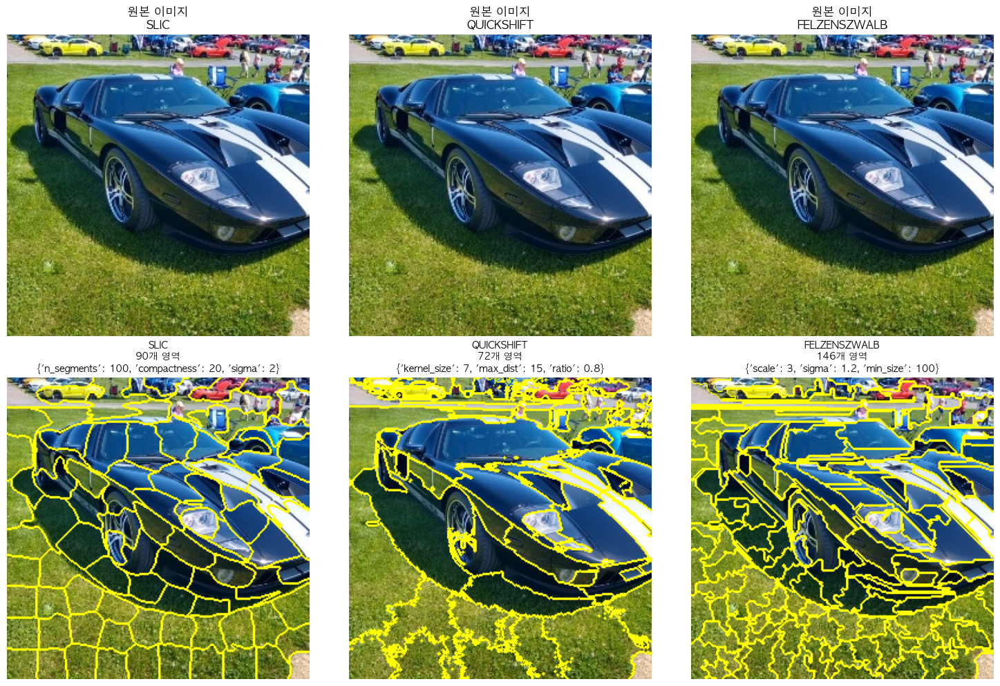

In [11]:
# 알고리즘별로 다른 파라미터 설정
custom_kwargs = {
    'slic': {
        'n_segments': 100,
        'compactness': 20,
        'sigma': 2
    },
    'quickshift': {
        'kernel_size': 7,
        'max_dist': 15,
        'ratio': 0.8
    },
    'felzenszwalb': {
        'scale': 3,
        'sigma': 1.2,
        'min_size': 100
    }
}

# 1. 알고리즘 비교
print("=== Superpixel 알고리즘 비교 ===")
results = compare_superpixel_algorithms(test_img, 
                                       algorithms=algorithms,
                                       algorithm_kwargs=custom_kwargs)

In [12]:
def analyze_comparison_results(results):
    """
    비교 결과를 분석합니다.
    
    Args:
        results: compare_superpixel_algorithms의 결과
    """
    print("=== 알고리즘 비교 결과 분석 ===")
    
    for algorithm, result in results.items():
        print(f"\n{algorithm.upper()} 알고리즘:")
        print(f"  파라미터: {result['params']}")
        print(f"  생성된 영역 수: {result['n_regions']}")
        
        # 특성 분석
        characteristics = analyze_superpixel_characteristics(result['segments'], algorithm)
        
        # 결과 저장
        result['characteristics'] = characteristics
    
    # 알고리즘별 성능 비교
    print(f"\n=== 알고리즘별 성능 비교 ===")
    for algorithm, result in results.items():
        chars = result['characteristics']
        print(f"{algorithm.upper()}: {chars['n_regions']}개 영역, "
              f"평균 크기 {chars['mean_size']:.1f}픽셀, "
              f"크기 비율 {chars['size_ratio']:.2f}")
    
    return results

In [13]:
# 3. 결과 분석
algorithms_comparison_results = analyze_comparison_results(results)

=== 알고리즘 비교 결과 분석 ===

SLIC 알고리즘:
  파라미터: {'n_segments': 100, 'compactness': 20, 'sigma': 2}
  생성된 영역 수: 90

SLIC 알고리즘 특성:
  영역 수: 90
  평균 크기: 728.18 픽셀
  크기 표준편차: 191.42
  최소 크기: 350 픽셀
  최대 크기: 1305 픽셀
  크기 비율: 3.73

QUICKSHIFT 알고리즘:
  파라미터: {'kernel_size': 7, 'max_dist': 15, 'ratio': 0.8}
  생성된 영역 수: 72

QUICKSHIFT 알고리즘 특성:
  영역 수: 72
  평균 크기: 910.22 픽셀
  크기 표준편차: 1227.50
  최소 크기: 17 픽셀
  최대 크기: 5599 픽셀
  크기 비율: 329.35

FELZENSZWALB 알고리즘:
  파라미터: {'scale': 3, 'sigma': 1.2, 'min_size': 100}
  생성된 영역 수: 146

FELZENSZWALB 알고리즘 특성:
  영역 수: 146
  평균 크기: 448.88 픽셀
  크기 표준편차: 256.81
  최소 크기: 114 픽셀
  최대 크기: 1424 픽셀
  크기 비율: 12.49

=== 알고리즘별 성능 비교 ===
SLIC: 90개 영역, 평균 크기 728.2픽셀, 크기 비율 3.73
QUICKSHIFT: 72개 영역, 평균 크기 910.2픽셀, 크기 비율 329.35
FELZENSZWALB: 146개 영역, 평균 크기 448.9픽셀, 크기 비율 12.49



=== 4. Superpixel 분할 테스트 ===
Superpixel 분할 시작: slic 알고리즘 사용
DEBUG: create_superpixels - image_float input shape: (256, 256, 3), dtype: float64
DEBUG: create_superpixels - segments output shape: (256, 256), dtype: int64
Superpixel 분할 완료: 34개 영역 생성
생성된 superpixel 개수: 34


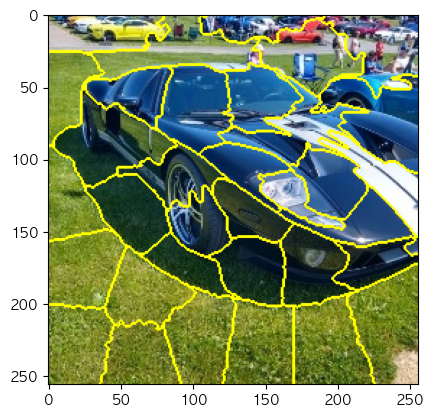

In [14]:
print("\n=== 4. Superpixel 분할 테스트 ===")
seg, seg_img = create_superpixels(test_img, algorithm='slic', n_segments=40, compactness=30)
print(f"생성된 superpixel 개수: {len(np.unique(seg))}")

plt.imshow(seg_img)
plt.show()


=== 5. Superpixel 마스킹 테스트 ===
랜덤 선택된 superpixel 인덱스: [32 15 28]


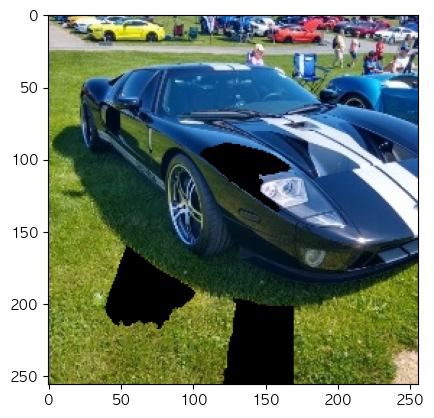

In [15]:
print("\n=== 5. Superpixel 마스킹 테스트 ===")
unique_segments = np.unique(seg)
test_segments = np.random.choice(unique_segments, size=min(3, len(unique_segments)), replace=False)
print(f"랜덤 선택된 superpixel 인덱스: {test_segments}")

masked_img = mask_superpixels(test_img, seg, test_segments, mask_value=0)

plt.imshow(masked_img)
plt.show()

### Image Masking

In [49]:
def compare_masking_methods(segment_id, original_img, segments):
    """다양한 마스킹 방식을 비교하는 함수"""
    
    # 1. 검은색 마스킹 (현재 방식)
    black_masked = mask_superpixels(original_img, segments, [segment_id], mask_value=0)
    
    # 2. 흰색 마스킹
    white_masked = mask_superpixels(original_img, segments, [segment_id], mask_value=255)
    
    # 3. 평균값 마스킹
    segment_pixels = original_img[segments == segment_id]
    mean_value = np.mean(segment_pixels, axis=0)
    mean_masked = mask_superpixels(original_img, segments, [segment_id], mask_value=mean_value)
    
    # 4. 가우시안 노이즈 마스킹
    noise_masked = original_img.copy()
    noise = np.random.normal(0, 25, original_img.shape).astype(np.uint8)
    noise_masked[segments == segment_id] = np.clip(
        original_img[segments == segment_id] + noise[segments == segment_id], 0, 255
    )
    
    # 5. 블러 마스킹
    blur_masked = original_img.copy()
    segment_mask = segments == segment_id
    blurred_region = cv2.GaussianBlur(original_img, (15, 15), 0)
    blur_masked[segment_mask] = blurred_region[segment_mask]
    
    # 6. 회색 마스킹
    gray_masked = mask_superpixels(original_img, segments, [segment_id], mask_value=128)
    
    return {
        'black': black_masked,
        'white': white_masked,
        'mean': mean_masked,
        'noise': noise_masked,
        'blur': blur_masked,
        'gray': gray_masked
    }


--- 다양한 마스킹 방식 비교 시각화 ---
테스트 슈퍼픽셀 ID: 6

--- black 마스킹 분석 ---
  신뢰도: 0.8827 (변화: +0.0913)
  IoU: 0.9795

--- white 마스킹 분석 ---
  신뢰도: 0.8456 (변화: +0.0543)
  IoU: 0.9820

--- mean 마스킹 분석 ---
  신뢰도: 0.8329 (변화: +0.0415)
  IoU: 0.9986

--- noise 마스킹 분석 ---
  신뢰도: 0.8196 (변화: +0.0282)
  IoU: 0.9935

--- blur 마스킹 분석 ---
  신뢰도: 0.7862 (변화: -0.0052)
  IoU: 0.9884

--- gray 마스킹 분석 ---
  신뢰도: 0.8327 (변화: +0.0414)
  IoU: 0.9866


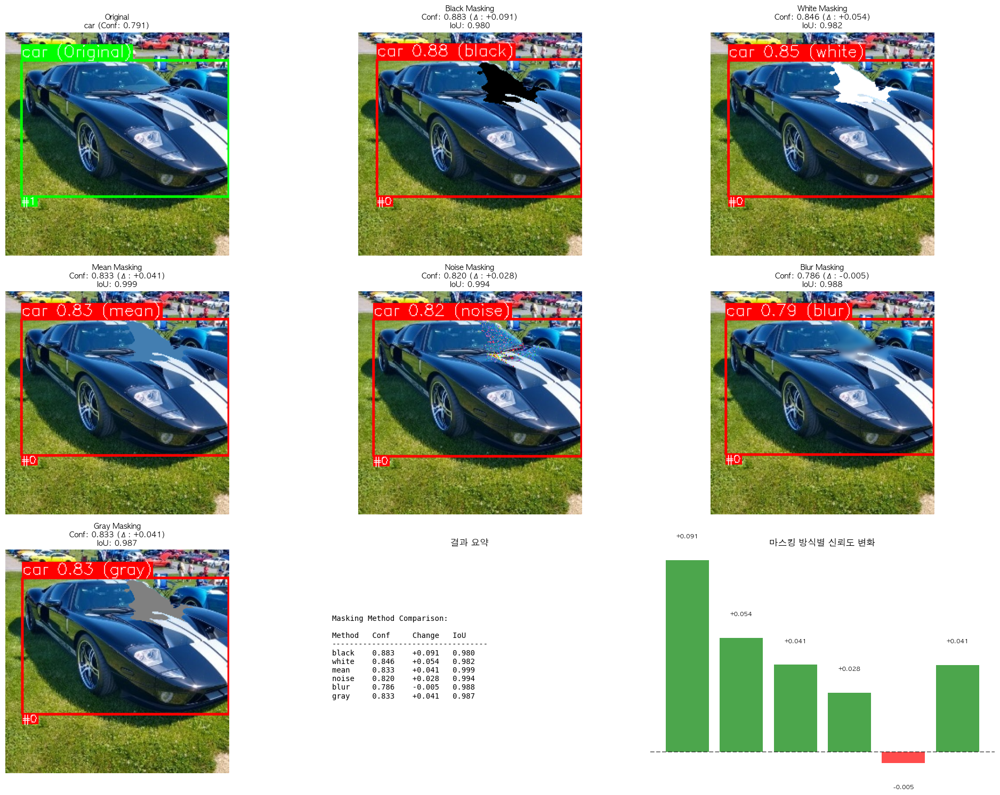


=== 마스킹 방식별 상세 분석 ===
신뢰도 변화 순위 (높은 순):
  #1: black (변화: +0.0913)
  #2: white (변화: +0.0543)
  #3: mean (변화: +0.0415)
  #4: gray (변화: +0.0414)
  #5: noise (변화: +0.0282)
  #6: blur (변화: -0.0052)

IoU 순위 (높은 순):
  #1: mean (IoU: 0.9986)
  #2: noise (IoU: 0.9935)
  #3: blur (IoU: 0.9884)
  #4: gray (IoU: 0.9866)
  #5: white (IoU: 0.9820)
  #6: black (IoU: 0.9795)

=== 해석 ===
가장 신뢰도 증가: black 마스킹
가장 신뢰도 감소: blur 마스킹
→ black 마스킹이 해당 슈퍼픽셀의 방해 요소를 가장 효과적으로 제거


In [50]:
# 다양한 마스킹 방식 비교 시각화
print("\n--- 다양한 마스킹 방식 비교 시각화 ---")

if all_results:
    # 신뢰도 변화가 가장 큰 슈퍼픽셀 선택
    test_segment_id = max_confidence_increase_result['segment_id']
    
    print(f"테스트 슈퍼픽셀 ID: {test_segment_id}")
    
    # 다양한 마스킹 방식으로 이미지 생성
    masked_images = compare_masking_methods(test_segment_id, original_img_rgb, segments)
    
    # 각 마스킹 방식별로 추론 및 결과 저장
    masking_results = {}
    
    for method_name, masked_img in masked_images.items():
        print(f"\n--- {method_name} 마스킹 분석 ---")
        
        # 추론
        results = model(masked_img)
        boxes, colors, names, indices = parse_detections(results)
        
        # 원본과 가장 유사한 객체 찾기
        best_iou = 0
        best_confidence = 0
        best_box = None
        best_name = None
        
        for i, box in enumerate(boxes):
            iou = calculate_iou(box, final_target_bbox_xyxy)
            if iou > best_iou:
                best_iou = iou
                best_confidence = results[0].boxes[i].conf.item() if i < len(results[0].boxes) else 0.0
                best_box = box
                best_name = names[i]
        
        confidence_change = best_confidence - final_target_conf
        
        masking_results[method_name] = {
            'masked_img': masked_img,
            'confidence': best_confidence,
            'confidence_change': confidence_change,
            'iou': best_iou,
            'box': best_box,
            'name': best_name
        }
        
        print(f"  신뢰도: {best_confidence:.4f} (변화: {confidence_change:+.4f})")
        print(f"  IoU: {best_iou:.4f}")
    
    # 시각화
    fig, axes = plt.subplots(3, 3, figsize=(20, 15))
    
    # 원본 이미지 (첫 번째 위치)
    original_vis = original_img_rgb.copy()
    original_vis = draw_detections(
        boxes=[final_target_bbox_xyxy],
        colors=[(0, 255, 0)],
        names=[f"{final_target_class_name} (Original)"],
        image=original_vis,
        indices=[target_object_display_index]
    )
    axes[0, 0].imshow(original_vis)
    axes[0, 0].set_title(f'Original\n{final_target_class_name} (Conf: {final_target_conf:.3f})', 
                         fontsize=10, fontweight='bold')
    axes[0, 0].axis('off')
    
    # 각 마스킹 방식별 결과
    method_names = ['black', 'white', 'mean', 'noise', 'blur', 'gray']
    positions = [(0, 1), (0, 2), (1, 0), (1, 1), (1, 2), (2, 0)]
    
    for i, (method_name, pos) in enumerate(zip(method_names, positions)):
        result = masking_results[method_name]
        
        # 마스킹된 이미지에 바운딩 박스 그리기
        vis_img = result['masked_img'].copy()
        if result['box'] is not None:
            vis_img = draw_detections(
                boxes=[result['box']],
                colors=[(255, 0, 0)],
                names=[f"{result['name']} ({method_name})"],
                image=vis_img,
                indices=[0]
            )
        
        axes[pos[0], pos[1]].imshow(vis_img)
        axes[pos[0], pos[1]].set_title(f'{method_name.capitalize()} Masking\nConf: {result["confidence"]:.3f} (Δ: {result["confidence_change"]:+.3f})\nIoU: {result["iou"]:.3f}', 
                                       fontsize=10, fontweight='bold')
        axes[pos[0], pos[1]].axis('off')
    
    # 결과 비교 테이블 (마지막 두 위치)
    axes[2, 1].axis('off')
    axes[2, 2].axis('off')

    # 결과 요약 테이블
    summary_text = "Masking Method Comparison:\n\n"
    summary_text += f"{'Method':<8} {'Conf':<8} {'Change':<8} {'IoU':<6}\n"
    summary_text += "-" * 35 + "\n"
    
    for method_name in method_names:
        result = masking_results[method_name]
        summary_text += f"{method_name:<8} {result['confidence']:<8.3f} {result['confidence_change']:<+8.3f} {result['iou']:<6.3f}\n"
    
    axes[2, 1].text(0.1, 0.5, summary_text, transform=axes[2, 1].transAxes, 
                    fontsize=10, verticalalignment='center', fontfamily='monospace')
    axes[2, 1].set_title('결과 요약', fontsize=12, fontweight='bold')
    
    # 신뢰도 변화 그래프
    methods = list(masking_results.keys())
    confidences = [masking_results[m]['confidence'] for m in methods]
    changes = [masking_results[m]['confidence_change'] for m in methods]
    
    bars = axes[2, 2].bar(methods, changes, color=['red' if c < 0 else 'green' for c in changes], alpha=0.7)
    axes[2, 2].axhline(y=0, color='black', linestyle='--', alpha=0.5)
    axes[2, 2].set_ylabel('신뢰도 변화')
    axes[2, 2].set_title('마스킹 방식별 신뢰도 변화')
    axes[2, 2].tick_params(axis='x', rotation=45)
    
    # 막대 위에 값 표시
    for bar, change in zip(bars, changes):
        height = bar.get_height()
        axes[2, 2].text(bar.get_x() + bar.get_width()/2., height + (0.01 if height >= 0 else -0.01),
                        f'{change:+.3f}', ha='center', va='bottom' if height >= 0 else 'top', fontsize=8)
    
    plt.tight_layout()
    plt.show()
    
    # 상세 분석
    print(f"\n=== 마스킹 방식별 상세 분석 ===")
    
    # 신뢰도 변화 순위
    sorted_methods = sorted(masking_results.items(), key=lambda x: x[1]['confidence_change'], reverse=True)
    
    print(f"신뢰도 변화 순위 (높은 순):")
    for i, (method, result) in enumerate(sorted_methods):
        print(f"  #{i+1}: {method} (변화: {result['confidence_change']:+.4f})")
    
    # IoU 순위
    sorted_iou = sorted(masking_results.items(), key=lambda x: x[1]['iou'], reverse=True)
    
    print(f"\nIoU 순위 (높은 순):")
    for i, (method, result) in enumerate(sorted_iou):
        print(f"  #{i+1}: {method} (IoU: {result['iou']:.4f})")
    
    # 해석
    print(f"\n=== 해석 ===")
    best_method = sorted_methods[0][0]
    worst_method = sorted_methods[-1][0]
    
    print(f"가장 신뢰도 증가: {best_method} 마스킹")
    print(f"가장 신뢰도 감소: {worst_method} 마스킹")
    print(f"→ {best_method} 마스킹이 해당 슈퍼픽셀의 방해 요소를 가장 효과적으로 제거")
    
else:
    print("분석 결과가 없어서 비교할 수 없습니다.")